<div style="border:solid Chocolate 2px; padding: 40px">

# Прогноз оплаты заявок для сервиса Repetit.ru

</div>

Цель: разработать модель, которая по имеющейся информации о клиенте и заявке будет предсказывать вероятность оплаты заявки клиентом. Заказчик - сервис по подбору репетиторов - хочет понять, какие заявки будут оплачены, а какие нет, чтобы одни обрабатывать вручную консультантами, а другие нет. Оценка качества модели будет производиться с использованием precision и ROC-AUC. 


Заказчику важны:

- качество предсказания;
- интерпретируемость.

## План работы
1. Обзор данных и предобработка

- Рассмотрим датасеты, которые имеются в нашем распоряжении - из каких данных они состоят.
- Проведем первичную предобработку, объединим датасеты.

2. Исследовательский анализ данных

- Изучим взаимоотношение признаков в зависимости от того, оплачена ли заявка или нет.
- Посмотрим на корреляции признаков.
- Подумаем, какие признаки еще можем создать.

3. Feature Engineering

- Создадим дополнительные признаки на основе имеющихся количественных, категориальных и текстовых признаков.
- Опробуем разные подходы к обработке текстовых признаков.

4. Подбор и обучение моделей.

- Выберем модель, подберем гиперпараменты.
- Выберем наилучшую модель с наивысшим показателем ROC AUC.

5. Тестирование модели.

- Проверим работу выбранной модели на тестовых данных.

In [1]:
pip install pymystem3 shap -q

Note: you may need to restart the kernel to use updated packages.


In [2]:
# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

/kaggle/input/orders.feather
/kaggle/input/teachers_info.feather
/kaggle/input/suitable_teachers.feather


In [3]:
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import phik
import seaborn as sns
import shap

from catboost import CatBoostClassifier, Pool

from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score, train_test_split, RandomizedSearchCV
from sklearn.metrics import roc_auc_score, log_loss, confusion_matrix, roc_curve
from sklearn.calibration import CalibratedClassifierCV
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn import metrics

from tqdm import tqdm
from time import sleep

import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import re

from pymystem3 import Mystem
from joblib import Parallel, delayed

In [4]:
tqdm.pandas()

## Обзор данных и предобработка

In [5]:
# загружаем имеющиеся данные

for i in ['orders', 'suitable_teachers', 'teachers_info']:
    pth = f'datasets/{i}.feather'
    pth2 = f'/kaggle/input/{i}.feather'

    if os.path.exists(pth):
        globals()[i] = pd.read_feather(pth)
    elif os.path.exists(pth2):
        globals()[i] = pd.read_feather(pth2)
    else:
        print('Something is wrong')

In [6]:
# функция для обзора данных

def dataframe_info(df):
    print("Размер:", df.shape)
    display(df.head())
    print("Info:\n")
    df.info()
    print()
    print("Пропущенные значения:\n", df.isnull().sum())
    print()
    print("Дубликаты:\n", df.duplicated().sum())

### orders

In [7]:
dataframe_info(orders)

Размер: (1191861, 38)


,id,order_date,subject_id,purpose,lesson_price,lesson_duration,lesson_place,home_metro_id,add_info,start_date,...,chosen_teachers_only,no_teachers_available,source_id,original_order_id,client_id,additional_status_id,max_metro_distance,estimated_fee,payment_date,is_display_to_teachers
0,2294054,2022-11-01 00:01:38.237,1.0,None,0,60,None,NaN,None,None,...,0,0,18,2294000.0,675960,7.0,NaN,None,None,1
1,2294055,2022-11-01 00:03:11.753,1.0,None,0,60,None,NaN,None,None,...,0,0,18,2294000.0,675960,7.0,NaN,None,None,1
2,2294056,2022-11-01 00:04:01.563,21.0,Разделы: начертательная геометрия.\nКатегория ...,800,60,None,NaN,Место проведения занятий: дистанционно (наприм...,2022-11-01 10:37:02.567,...,0,0,23,NaN,1024439,10.0,NaN,1200,None,1
3,2294057,2022-11-01 00:08:47.237,8.0,Разделы: школьный курс.\nКатегория ученика: ш...,700,60,None,NaN,Место проведения занятий: дистанционно (наприм...,2022-11-01 00:08:47.437,...,0,0,14,2293804.0,1024340,17.0,NaN,2310,None,1
4,2294058,2022-11-01 00:11:49.417,8.0,None,0,60,None,122.0,None,None,...,0,0,16,NaN,1024440,5.0,NaN,None,None,1


Info:

<class 'pandas.core.frame.DataFrame'>
Index: 1191861 entries, 0 to 437216
Data columns (total 38 columns):
 #   Column                   Non-Null Count    Dtype  
---  ------                   --------------    -----  
 0   id                       1191861 non-null  int32  
 1   order_date               1191861 non-null  object 
 2   subject_id               1181529 non-null  float32
 3   purpose                  1025351 non-null  object 
 4   lesson_price             1191861 non-null  int32  
 5   lesson_duration          1191861 non-null  int32  
 6   lesson_place             31 non-null       object 
 7   home_metro_id            642447 non-null   float32
 8   add_info                 1044688 non-null  object 
 9   start_date               705578 non-null   object 
 10  working_teacher_id       705988 non-null   float32
 11  status_id                1191861 non-null  int32  
 12  comments                 341468 non-null   object 
 13  prefered_teacher_id      4 non-null      

#### Дубликаты и лишние призаки

Полные дубликаты мы можем сразу удалить, чтобы они не мешали дальнейшему исследованию, тем более что их не много относительно общего объема датасета. Также можем удалить столбцы, по которым практически нет данных: lesson_place, prefered_teacher_id и max_metro_distance.

Также нужно удалить данные, которых не может быть в заявке изначально (чтобы не было утечки): amount_to_pay, first_lesson_date, payment_date.

Также удалим поля, прямо указывающие на статус: status_id (после создания таргета - оплачена ли заявка) и additional_status_id, и поля working_teacher_id, start_date, comments, estimated_fee - по уточнению заказчика, данная информация тоже не доступна на момент подачи заявки и появляется уже позже.

Специфичными являются данные с окончанием "_id" - поскольку у нас нет дополнительных таблиц, которые давали бы по ним больше информации, мы можем их использовать в качестве самостоятельных категориальных признаков или создавая дополнительные признаки на их основе.

In [8]:
# Выбираем столбцы, которые заканчиваются на "_id"
id_columns = orders.filter(like='_id')

# Посчитаем количество уникальных значений для каждого столбца
unique_counts = id_columns.nunique()

print(unique_counts)

subject_id                   30
home_metro_id              2326
working_teacher_id        58534
status_id                    18
prefered_teacher_id           3
creator_id               107753
pupil_category_new_id        19
source_id                    25
original_order_id        314931
client_id                487595
additional_status_id         27
dtype: int64


У home_metro_id и creator_id слишком много уникальных значений, чтобы модель просчитывала их как категориальные, и эти признаки не видятся значимыми для прогноза, поэтому можем их удалить. По client_id мы могли бы узнать клиентов конкретных клиентов, которые всегда платят по заявкам, но тогда наша модель будет справляться с прогнозом гораздо хуже при появлении новых клиентов, и будет сразу занижать их потенциальную возможность оплатить. Поэтому client_id мы тоже удалим.

In [9]:
# функция для очистки orders от дубликатов и лишних столбцов

def clean_orders_dataframe(orders):

    # Удаление дубликатов
    orders_cleaned = orders.drop_duplicates()

    # Список столбцов для удаления
    columns_to_drop = [
        'lesson_place', 'prefered_teacher_id', 'max_metro_distance',
        'amount_to_pay', 'home_metro_id', 'creator_id', 'client_id',
        'first_lesson_date', 'payment_date', 'start_date', 'status_id',
        'additional_status_id', 'working_teacher_id', 'comments', 'estimated_fee'
    ]

    # Удаление ненужных столбцов
    orders_cleaned = orders_cleaned.drop(columns_to_drop, axis=1)

    return orders_cleaned

#### Анализ выбросов

Посмотрим на то, как выглядят данные на гистограммах, чтобы сразу заметить данные с явными отклонениями.

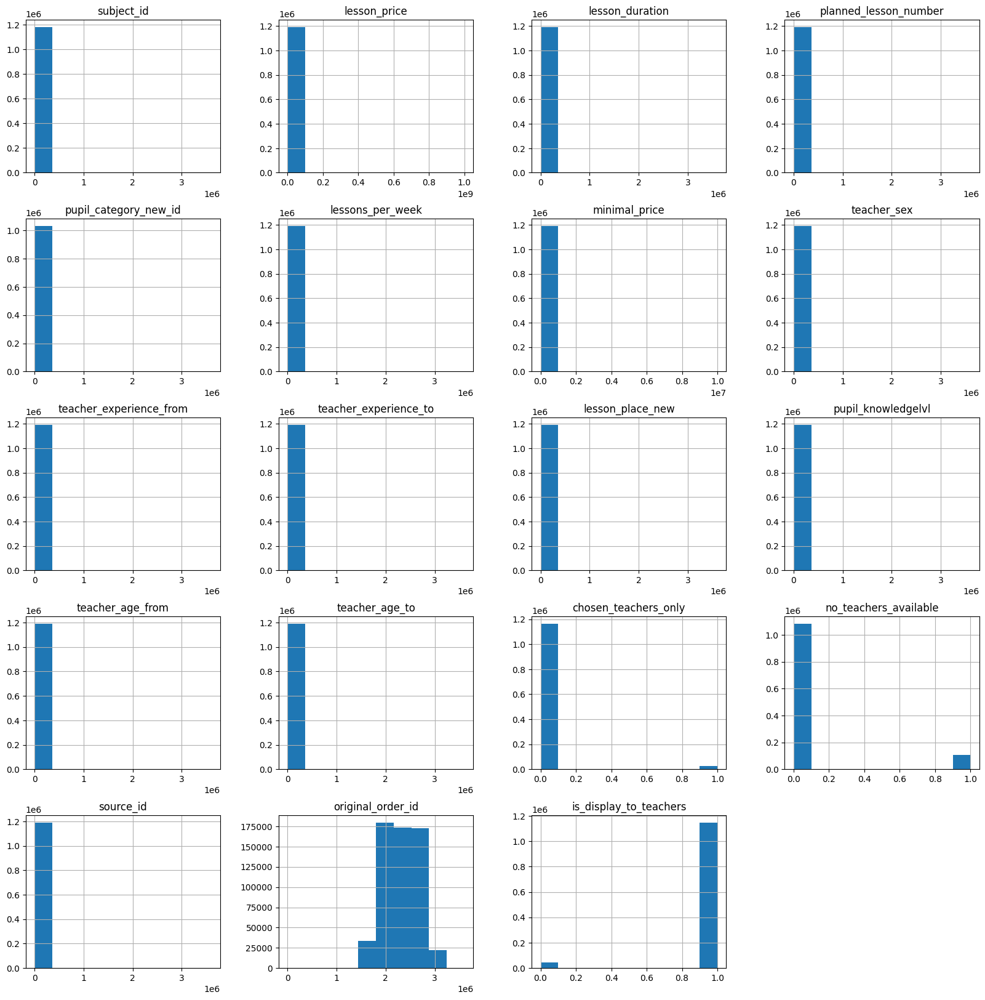

In [10]:
orders.drop(['id', 'lesson_place', 'prefered_teacher_id', 'max_metro_distance',
        'amount_to_pay', 'home_metro_id', 'creator_id', 'client_id',
        'first_lesson_date', 'payment_date', 'start_date', 'status_id',
        'additional_status_id', 'working_teacher_id', 'comments', 
             'estimated_fee'], axis=1).hist(figsize=(20, 20), layout=(-1, 4))
plt.show()

Практически во всех признаках есть выбросы, но поскольку мы планируем использовать модель, основанную на деревьях, выбросы не так страшны. Проведем лишь минимальную обработку данных.
Стоит изучить на наличие выбросов следующие количественные данные: lesson_price, minimal_price, teacher_experience_from, teacher_experience_to, teacher_age_from, teacher_age_to. 

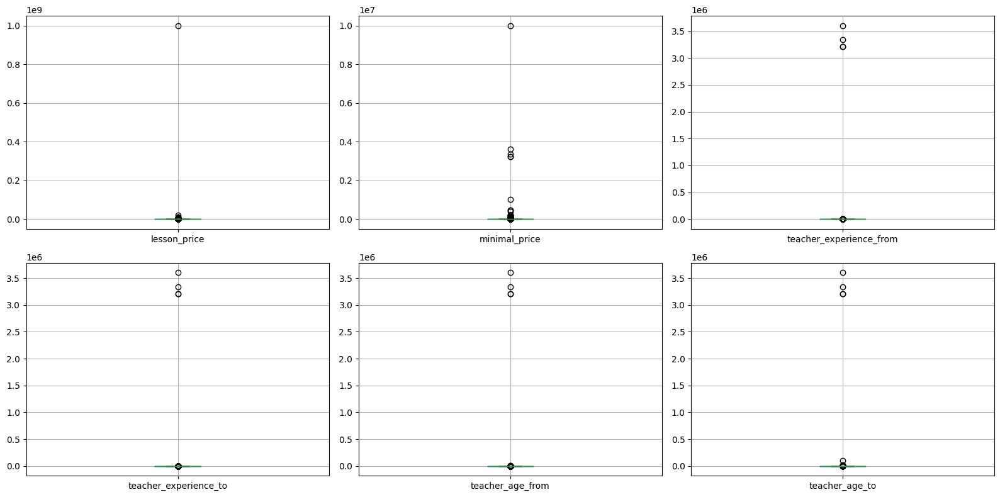

In [11]:
num_columns = ['lesson_price', 
               'minimal_price', 
               'teacher_experience_from', 
               'teacher_experience_to', 
               'teacher_age_from', 
               'teacher_age_to']

# Создаем сетку для диаграмм
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(16, 8))
plt.subplots_adjust(wspace=0.5, hspace=0.5)

for i, feature in enumerate(num_columns):
    row = i // 3
    col = i % 3
    ax = axes[row, col]
    
    # Создаем боксплот для текущего признака
    orders.boxplot(column=feature, ax=ax)

plt.tight_layout()
plt.show()

Изучим lesson_price. По информации от заказчика, ограничений по максимальной цене урока нет, но адекватно около 10 тысяч рублей. Посмотрим, какое количество заявок больше этой суммы.

In [12]:
orders[orders.lesson_price > 10000].sort_values(by='lesson_price', ascending=False)

,id,order_date,subject_id,purpose,lesson_price,lesson_duration,lesson_place,home_metro_id,add_info,start_date,...,chosen_teachers_only,no_teachers_available,source_id,original_order_id,client_id,additional_status_id,max_metro_distance,estimated_fee,payment_date,is_display_to_teachers
21341,1862907,2021-11-20 13:20:45.717,2.0,\n​Категория ученика : школьники 7 класса,1000000000,60,None,NaN,"\n​Свободное время : Понедельник-утро,Понедель...",None,...,0,0,16,NaN,872053,6.0,NaN,None,None,1
81022,1922597,2022-01-17 14:47:58.423,1.0,"\n​Разделы : школьный курс, .вузовский курс \...",20000000,60,None,NaN,"\n​Свободное время : Среда-утро,Четверг-день,С...",None,...,0,0,16,NaN,891766,5.0,NaN,None,None,1
94824,2388889,2022-12-26 10:04:21.907,8.0,\n​Разделы : алгебра \n​Цель занятий : люблю м...,10090000,60,None,NaN,"\n​Свободное время : Понедельник-утро,Вторник-...",None,...,0,0,16,NaN,1058704,14.0,NaN,None,None,1
363192,2206463,2022-09-19 18:23:30.640,2.0,\n​Цель занятий : Хочу что ты свн позанимался ...,10000000,60,None,258.0,\n​Место проведения занятий : у ученика(Улица ...,None,...,0,0,16,2206462.0,994865,7.0,NaN,None,None,1
292373,2135618,2022-08-16 01:46:00.420,25.0,\n​Разделы : иероглифика \n​Дополнения : серти...,7777777,60,None,1766.0,\n​Место проведения занятий : у преподавателя ...,None,...,0,0,16,NaN,970980,16.0,NaN,None,None,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8701,2302755,2022-11-06 16:02:26.110,11.0,Разделы: школьный курс.\nДополнения: ЕГЭ.\nКа...,11000,0,None,789.0,Район: Октябрьский район.\nМесто проведения за...,2022-11-06 16:02:26.343,...,0,0,14,2302512.0,1027024,13.0,NaN,38500,None,1
8935,2302989,2022-11-06 17:52:15.193,11.0,Разделы: школьный курс.\nДополнения: ЕГЭ.\nКа...,11000,0,None,789.0,Район: Октябрьский район.\nМесто проведения за...,2022-11-07 09:21:40.337,...,0,0,14,2302512.0,1027024,13.0,NaN,38500,None,1
20106,2314163,2022-11-11 15:22:13.770,11.0,Разделы: школьный курс.\nДополнения: ЕГЭ.\nКа...,11000,0,None,789.0,Район: Октябрьский район.\nМесто проведения за...,2022-11-15 09:00:43.940,...,0,0,14,2302512.0,1027024,13.0,NaN,38500,None,1
7856,2288810,2022-10-28 16:56:27.357,33.0,Разделы: иврит.\nКатегория ученика: ИЛИ ОДНА м...,10800,60,None,145.0,Район: м. Полянка.\nМесто проведения занятий: ...,2022-10-28 20:56:12.370,...,0,0,8,NaN,1022651,10.0,NaN,30240,None,1


In [13]:
orders.shape

(1191861, 38)

В 734 заявках указана цена выше 10 тыс рублей, причем по данным видим, что многие значения - явно выбросы. От общих данных это меньше 0.1%, можем удалить эти заявки. 

Изучим столбец minimal_price. Кажется, что она также не должна превышать 10 000 руб. Посмотрим, много ли таких данных.

In [14]:
orders[orders.minimal_price > 10000].sort_values(by='minimal_price', ascending=False)

,id,order_date,subject_id,purpose,lesson_price,lesson_duration,lesson_place,home_metro_id,add_info,start_date,...,chosen_teachers_only,no_teachers_available,source_id,original_order_id,client_id,additional_status_id,max_metro_distance,estimated_fee,payment_date,is_display_to_teachers
363192,2206463,2022-09-19 18:23:30.640,2.0,\n​Цель занятий : Хочу что ты свн позанимался ...,10000000,60,None,258.0,\n​Место проведения занятий : у ученика(Улица ...,None,...,0,0,16,2206462.0,994865,7.0,NaN,None,None,1
437216,3605505,0029-07-18 05:28:02.684,3605505.0,None,3605505,3605505,None,3605505.0,None,0029-07-18 05:28:02.684,...,1,1,3605505,3605505.0,3605505,3605505.0,3605505.0,"4,450342944189884E-308",0029-07-18 05:28:02.684,1
109392,3342337,0042-01-12 04:26:08.039,3342337.0,None,3342337,3342337,None,3342337.0,None,0042-01-12 04:26:08.039,...,1,1,3342337,3342337.0,3342337,3342337.0,3342337.0,"8,344239172283769E-308",0042-01-12 04:26:08.039,1
105390,3211265,0042-01-12 05:09:05.007,3211265.0,None,3211265,3211265,None,3211265.0,None,0042-01-12 05:09:05.007,...,1,1,3211265,3211265.0,3211265,3211265.0,3211265.0,"8,344264636103745E-308",0042-01-12 05:09:05.007,1
79972,3211265,0042-01-12 05:09:05.007,3211265.0,None,3211265,3211265,None,3211265.0,None,0042-01-12 05:09:05.007,...,1,1,3211265,3211265.0,3211265,3211265.0,3211265.0,"8,344264636103745E-308",0042-01-12 05:09:05.007,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
246355,2089597,2022-06-21 11:28:41.767,33.0,Комиссия Ассоциации Репетиторов 25% от общего ...,18000,0,None,47.0,За выполненную запись готовы оплатить от 1200...,2022-06-21 15:25:39.097,...,0,0,4,NaN,953071,13.0,NaN,4500,None,1
50669,1892239,2021-12-16 16:52:04.853,3.0,Разделы: общий курс.\nКатегория ученика: 4 уче...,15000,0,None,230.0,Район: г. Ногинск.\nМесто проведения занятий: ...,None,...,0,0,14,1891883.0,249682,4.0,NaN,22500,None,1
73742,2661753,2023-07-07 15:08:53.217,8.0,Группа учеников от 2 до 9 человек.\nРазделы: ...,25000,0,None,459.0,Оклад в месяц от 11200 до 25000\n Выплачиваетс...,2023-07-07 18:30:20.383,...,0,0,14,2658438.0,705953,17.0,NaN,81250,None,1
88074,2676085,2023-07-21 10:54:12.013,8.0,Группа учеников от 2 до 9 человек.\nРазделы: ш...,25000,0,None,459.0,Оклад в месяц от 11200 до 25000\nВыплачивается...,2023-07-21 14:15:13.687,...,0,0,16,2658438.0,705953,10.0,NaN,81250,None,1


 Таких данных немного, удалим их, чтобы они не влияли на дальнейший анализ.

В данных, которые касаются стажа учителей, вероятно, закрались опечатки там, где стаж более 20 лет. В таких данных мы можем убрать лишние десятки лет.

Кроме того, у данных по возрасту учителей есть отрицательные значения, заменим их на 0 (полагая, что в заявке имелось в виду, что возраст не важен).

Заменим аномальный возраст в teacher_age_from и teacher_age_to на моду по данному столбцу, чтобы выбросы не влияли на анализ.

In [15]:
# функция для коррекции orders от выбросов

def adjust_dataset_from_outliers(orders):

    # Условия для коррекции значений
    condition_1 = orders['lesson_price'] <= 10000
    condition_2 = orders['minimal_price'] <= 10000
    condition_3 = orders['teacher_experience_from'] > 20
    condition_4 = orders['teacher_experience_to'] >= 50
    condition_5 = orders['teacher_age_from'] < 0
    condition_6 = orders['teacher_age_to'] < 0

    # Коррекция значений по условиям
    orders.loc[condition_1, 'lesson_price'] = orders.loc[condition_1, 'lesson_price']
    orders.loc[condition_2, 'minimal_price'] = orders.loc[condition_2, 'minimal_price']

    orders.loc[condition_3, 'teacher_experience_from'] /= 10
    orders.loc[condition_4, 'teacher_experience_to'] /= 10
    orders.loc[condition_5, 'teacher_age_from'] *= 0
    orders.loc[condition_6, 'teacher_age_to'] *= 0

    orders.loc[orders['teacher_age_from'] > 60, 'teacher_age_from'] = orders['teacher_age_from'].mode()[0]
    orders.loc[orders['teacher_age_to'] > 100, 'teacher_age_to'] = orders['teacher_age_to'].mode()[0]

    return orders

#### Таргет и дубли заявок

По информации от заказчика, акт оплаты указан в столбце status_id под следующими id: 5,6,13,15. Создадим новый столбец is_paid с бинарными данными: 1 - оплачено, 0 - не оплачено.

In [16]:
orders['is_paid'] = orders['status_id'].apply(lambda x: 1 if x in [5, 6, 13, 15] else 0)

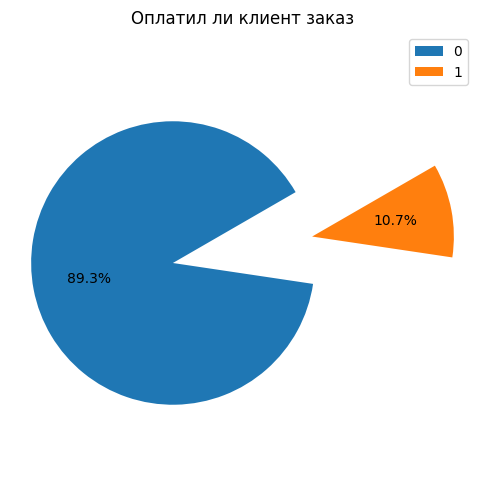

In [17]:
plt.figure(figsize=(6, 6))
plt.pie(orders.is_paid.value_counts(), 
        orders.is_paid.value_counts().index, 
        autopct='%1.1f%%', 
        startangle=30)
plt.axis('equal')
plt.legend(orders.is_paid.value_counts().index, loc='best')
plt.title('Оплатил ли клиент заказ')
plt.show()

У заявок могут быть дубли (например, если нужно было назначить дополнительного репетитора), при этом в дубле создаётся запись original_order_id = номер первой заявки. Согласно ТЗ, стоит помечать всю группу дублей как "оплачено", если хотя бы один из дублей оплачен.

Посмотрим на совпадения id и original_order_id.

In [18]:
orders[orders.id == orders.original_order_id]

,id,order_date,subject_id,purpose,lesson_price,lesson_duration,lesson_place,home_metro_id,add_info,start_date,...,no_teachers_available,source_id,original_order_id,client_id,additional_status_id,max_metro_distance,estimated_fee,payment_date,is_display_to_teachers,is_paid
1016,2295070,2022-11-01 15:07:53.233,21.0,None,0,60,None,NaN,Дополнительная информация:\r\nИзучаемый предме...,None,...,0,8,2295070.0,1024766,7.0,NaN,None,None,1,0
3190,2297244,2022-11-02 16:59:27.860,2.0,None,0,60,None,NaN,None,None,...,0,16,2297244.0,950620,7.0,NaN,None,None,1,0
3521,2297575,2022-11-02 19:33:30.823,2.0,"Цели: нагнать пропущенные темы, преодолеть язы...",5000,60,None,NaN,Желаемое время для занятий: Подстроюсь под реп...,None,...,0,23,2297575.0,650817,7.0,NaN,None,None,1,0
6673,2300727,2022-11-04 23:14:45.327,21.0,Разделы: балет.\nКатегория ученика: школьник 4...,2000,60,None,287.0,Район: м. Горьковская.\nМесто проведения занят...,2022-11-06 09:02:07.943,...,0,23,2300727.0,1026444,10.0,NaN,6300,None,1,0
7970,2302024,2022-11-06 06:46:17.337,1.0,Разделы: школьный курс.\nКатегория ученика: м...,800,60,None,911.0,Район: Советский район.\nМесто проведения заня...,2022-11-28 05:04:30.073,...,1,16,2302024.0,1026883,10.0,NaN,880,None,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
431936,2275227,2022-10-21 18:41:31.937,14.0,Разделы: школьный курс.\nДополнения: ЕГЭ.\nКа...,700,60,None,883.0,Район: Железнодорожный район.\nМесто проведени...,None,...,1,9,2275227.0,1014652,7.0,NaN,770,None,1,0
432445,2275736,2022-10-22 08:39:23.887,1.0,Цели: улучшить успеваемость.\nКатегория ученик...,900,60,None,1099.0,None,None,...,0,23,2275736.0,1017407,7.0,NaN,None,None,1,0
433244,2276535,2022-10-22 16:18:39.587,8.0,Разделы: школьный курс.\nДополнения: ЕГЭ.\nКат...,700,60,None,209.0,Район: г. Железнодорожный.\nМесто проведения з...,None,...,1,14,2276535.0,978479,8.0,NaN,5025,None,1,0
433772,2277063,2022-10-22 22:33:58.163,8.0,"Разделы: высшая математика, линейная алгебра, ...",2000,60,None,2433.0,Район: м. Ломоносовский проспект.\nМесто прове...,2022-10-23 12:10:18.433,...,0,16,2277063.0,1008056,13.0,NaN,5800,None,1,0


848 заявок, где order_id совпадает с original_order_id. При этом в колонке original_order_id почти в половине данных - пропуски. Заполним их номером id: логично, что если это изначальная заявка, тогда id и original_order_id должны совпадать.

In [19]:
orders['original_order_id'] = orders['original_order_id'].fillna(orders['id'])

Посмотрим, как выглядят дублированные заявки, на примере нескольких original_order_id.

In [20]:
pd.set_option('display.max_columns', None)
orders[orders.original_order_id.isin([2297575, 2300727, 2294078])].sort_values(by='original_order_id')

,id,order_date,subject_id,purpose,lesson_price,lesson_duration,lesson_place,home_metro_id,add_info,start_date,working_teacher_id,status_id,comments,prefered_teacher_id,amount_to_pay,planned_lesson_number,first_lesson_date,creator_id,pupil_category_new_id,lessons_per_week,minimal_price,teacher_sex,teacher_experience_from,teacher_experience_to,lesson_place_new,pupil_knowledgelvl,teacher_age_from,teacher_age_to,chosen_teachers_only,no_teachers_available,source_id,original_order_id,client_id,additional_status_id,max_metro_distance,estimated_fee,payment_date,is_display_to_teachers,is_paid
24,2294078,2022-11-01 01:42:48.730,1.0,Разделы: школьный курс.\nКатегория ученика: в...,1000,60,None,1658.0,Район: Индустриальный район.\nМесто проведения...,2022-11-01 16:40:05.673,101215.0,16,Тестовая группа : SplitTestB\n?Статус дозаполн...,NaN,0,10,None,NaN,15.0,4,600,2,0,0,6,0,40,80,0,0,16,2294078.0,1024450,13.0,NaN,3000,None,1,0
1233,2295287,2022-11-01 16:40:19.203,1.0,Разделы: школьный курс.\nКатегория ученика: в...,1000,60,None,1658.0,Район: Индустриальный район.\nМесто проведения...,2022-11-01 16:40:29.107,70407.0,16,None,NaN,0,10,None,1509.0,15.0,4,600,2,0,0,6,0,40,80,0,0,14,2294078.0,1024450,13.0,NaN,2900,None,1,0
1235,2295289,2022-11-01 16:40:41.543,1.0,Разделы: школьный курс.\nКатегория ученика: в...,1000,60,None,1658.0,Район: Индустриальный район.\nМесто проведения...,2022-11-01 16:40:52.307,115470.0,16,None,NaN,0,10,None,1509.0,15.0,4,600,2,0,0,6,0,40,80,0,0,14,2294078.0,1024450,13.0,NaN,2900,None,1,0
1975,2296029,2022-11-02 01:26:43.830,1.0,None,0,60,None,1658.0,None,None,NaN,16,Тестовая группа : SplitTestB,NaN,0,0,None,1060866.0,NaN,0,0,0,0,0,0,0,0,0,0,0,16,2294078.0,1024450,7.0,NaN,None,None,1,0
12755,2306809,2022-11-08 13:24:50.027,1.0,Разделы: школьный курс.\nКатегория ученика: в...,1000,60,None,1658.0,Район: Индустриальный район.\nМесто проведения...,2022-11-08 13:29:02.133,264608.0,6,None,NaN,1700,10,2022-11-14 00:00:00.000,1509.0,15.0,4,600,2,0,0,2,0,40,80,0,0,14,2294078.0,1024450,NaN,NaN,1700,2022-11-22 04:22:10.217,1,1
3521,2297575,2022-11-02 19:33:30.823,2.0,"Цели: нагнать пропущенные темы, преодолеть язы...",5000,60,None,NaN,Желаемое время для занятий: Подстроюсь под реп...,None,NaN,16,None,NaN,0,10,None,NaN,12.0,3,0,2,0,0,4,3,16,90,0,0,23,2297575.0,650817,7.0,NaN,None,None,1,0
3529,2297583,2022-11-02 19:37:08.673,2.0,"Цели: улучшить успеваемость, преодолеть языков...",2500,60,None,NaN,Желаемое время для занятий: Подстроюсь под реп...,None,NaN,16,None,NaN,0,10,None,605618.0,12.0,3,0,2,0,0,4,3,16,90,0,0,23,2297575.0,650817,7.0,NaN,None,None,1,0
6673,2300727,2022-11-04 23:14:45.327,21.0,Разделы: балет.\nКатегория ученика: школьник 4...,2000,60,None,287.0,Район: м. Горьковская.\nМесто проведения занят...,2022-11-06 09:02:07.943,142249.0,16,None,NaN,0,10,None,NaN,5.0,3,0,2,0,0,2,0,0,0,0,0,23,2300727.0,1026444,10.0,NaN,6300,None,1,0
6767,2300821,2022-11-05 08:21:16.070,21.0,Разделы: балет.\nКатегория ученика: 4 класс.\n,2000,60,None,483.0,Желаемое время для занятий: Подстроюсь под реп...,None,NaN,7,None,NaN,0,2,None,1063192.0,5.0,3,0,2,0,0,7,0,16,90,0,0,23,2300727.0,1026444,7.0,NaN,None,None,1,0
6768,2300822,2022-11-05 08:24:18.987,21.0,Разделы: балет.\nКатегория ученика: 4 класс.\n,5000,60,None,483.0,Количество занятий в неделю: 2.\nВозраст репет...,None,NaN,16,None,NaN,0,2,None,1063192.0,5.0,4,0,0,0,0,7,0,16,90,0,0,23,2300727.0,1026444,7.0,NaN,None,None,1,0


Заметно, какие данные у дублей меняются чаще всего: в первую очередь working_teacher_id, lesson_price, home_metro_id, add_info.

Создадим столбец target - в нём будут помечены все факты оплаты по заявкам, в том числе если они являются дублями оплаченных заявок.

In [21]:
orders['target'] = orders.groupby('original_order_id')['is_paid'].transform('max')

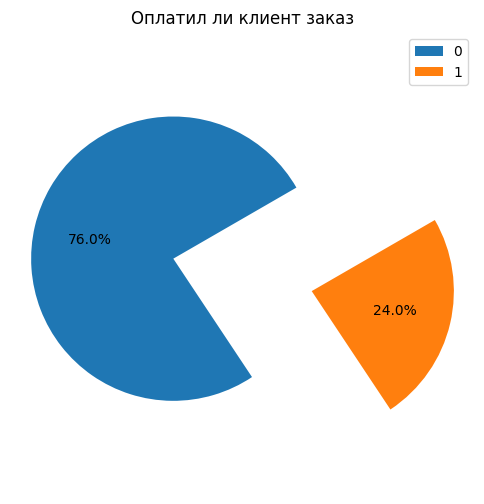

In [22]:
plt.figure(figsize=(6, 6))
plt.pie(orders.target.value_counts(), 
        orders.target.value_counts().index, 
        autopct='%1.1f%%', 
        startangle=30)
plt.axis('equal')
plt.legend(orders.target.value_counts().index, loc='best')
plt.title('Оплатил ли клиент заказ')
plt.show()

Датасет не сбалансирован - нужно будет это учесть при разделении на обучающую и тестовую выборки и при обучении моделей.

#### Выполнение функций предобработки

In [23]:
# выполним функции предобработки orders

orders = clean_orders_dataframe(orders)
orders = adjust_dataset_from_outliers(orders)

/tmp/ipykernel_33/638827141.py:17: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[3.000000e+00 2.500000e+00 2.300000e+00 2.300000e+00 3.000000e+00
 2.500000e+00 2.500000e+00 2.500000e+00 2.500000e+00 3.000000e+00
 3.000000e+00 3.000000e+00 2.500000e+00 3.211265e+05 3.000000e+00
 2.800000e+00 3.000000e+00 3.000000e+00 2.500000e+00 2.500000e+00
 3.000000e+00 3.700000e+00 3.200000e+00 2.100000e+00 3.300000e+00
 3.000000e+00 3.000000e+00 2.500000e+00 3.000000e+00 3.000000e+00
 2.400000e+00 3.000000e+00 3.000000e+00 3.000000e+00 2.500000e+00
 2.500000e+00 3.200000e+00 3.600000e+00 2.900000e+00 3.000000e+00
 3.000000e+00 3.000000e+00 2.200000e+00 3.000000e+00 2.500000e+00
 2.400000e+00 2.500000e+00 3.000000e+00 2.400000e+00 2.500000e+00
 2.500000e+00 3.000000e+00 3.000000e+00 2.500000e+00 2.500000e+00
 2.500000e+00 2.300000e+00 2.500000e+00 2.500000e+00 2.300000e+00
 3.000000e+00 3.000000e+00 3.000000e+00 3.00

In [24]:
orders.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1190961 entries, 0 to 437216
Data columns (total 25 columns):
 #   Column                   Non-Null Count    Dtype  
---  ------                   --------------    -----  
 0   id                       1190961 non-null  int32  
 1   order_date               1190961 non-null  object 
 2   subject_id               1180636 non-null  float32
 3   purpose                  1024538 non-null  object 
 4   lesson_price             1190961 non-null  int32  
 5   lesson_duration          1190961 non-null  int32  
 6   add_info                 1043862 non-null  object 
 7   planned_lesson_number    1190961 non-null  int32  
 8   pupil_category_new_id    1031655 non-null  float32
 9   lessons_per_week         1190961 non-null  int32  
 10  minimal_price            1190961 non-null  int32  
 11  teacher_sex              1190961 non-null  int32  
 12  teacher_experience_from  1190961 non-null  float64
 13  teacher_experience_to    1190961 non-null  float

### teachers_info

In [25]:
dataframe_info(teachers_info)

Размер: (307972, 80)


,id,date_update,reg_date,birth_date,teaching_start_date,user_id,is_email_confirmed,is_home_lessons,is_external_lessons,external_comments,lesson_duration,lesson_cost,status_id,status_relevant_date,status_school_id,status_college_id,status_display,russian_level_id,home_country_id,information,is_confirmed,external_comments.1,lesson_duration.1,lesson_cost.1,status_id.1,status_relevant_date.1,status_school_id.1,status_college_id.1,status_display.1,russian_level_id.1,home_country_id.1,information.1,is_confirmed.1,external_comments.2,lesson_duration.2,lesson_cost.2,status_id.2,status_relevant_date.2,status_school_id.2,status_college_id.2,status_display.2,russian_level_id.2,home_country_id.2,photo_path,information.2,is_confirmed.2,is_display,rating_id,rating,comments,rules_confirmed_date,last_visited,is_pupils_needed,is_cell_phone_confirmed,effective_rating,area_id,pupil_needed_date,sex,amount_to_pay,is_remote_lessons,remote_comments,show_on_map,send_mailing,send_suitable_orders,rating_for_users,rating_for_admin,passport_id,is_edited,orders_allowed,display_days,verification_status_id,is_individual,partner_id,star_rating,rating_for_users_yesterday,review_num,relevance_date,is_display_at_partners,status_institution_id,free_time_relevance_date
0,33,2023-11-07 14:20:28.323,2007-12-24 19:26:46.000,1983-06-05 00:00:00.000,1989-09-01 00:00:00.000,45,0,0,0,NaN,60,1000,4,NaN,NaN,NaN,0,5,7,[p]&nbsp;[/p][p]&nbsp;[/p][p]?[/p][p]133320 Ка...,1,NaN,60,1000,4,NaN,NaN,NaN,0,5,7,[p]&nbsp;[/p][p]&nbsp;[/p][p]?[/p][p]133320 Ка...,1,NaN,60,1000,4,NaN,NaN,NaN,0,5,7,/teachers/33/photo/photo_small.jpg,[p]&nbsp;[/p][p]&nbsp;[/p][p]?[/p][p]133320 Ка...,1,1,15,5,Швачко М.Н. 15.01.2018 14:59 - 33\r\nАникеева ...,2016-02-12 21:06:51.000,2022-10-24 16:48:38.410,1.0,0,4.679688,1,NaN,1,500,1,NaN,0,1,0,1138.0,237.5,NaN,1,0,492.0,1,NaN,NaN,4.500000,1138.0,6,2022-05-16 18:44:59.993,0,3702.0,2023-11-06 14:20:15.173
1,46,2023-01-19 17:36:42.233,2007-12-24 19:26:46.000,1980-02-12 00:00:00.000,2003-09-01 00:00:00.000,63,0,1,1,NaN,60,500,5,NaN,NaN,NaN,1,5,7,NaN,1,NaN,60,500,5,NaN,NaN,NaN,1,5,7,NaN,1,NaN,60,500,5,NaN,NaN,NaN,1,5,7,/teachers/46/photo/photo_small.webp,NaN,1,0,4,-3,NaN,2014-08-12 00:00:00.000,NaN,1.0,0,0.000000,1,NaN,3,0,0,NaN,0,1,1,25.0,0.0,NaN,1,1,0.0,1,NaN,NaN,4.300781,25.0,0,2017-01-01 00:00:00.000,1,NaN,NaN
2,51,2023-05-25 09:04:45.243,2007-12-24 19:26:46.000,1965-04-30 00:00:00.000,1988-09-01 00:00:00.000,68,0,0,0,NaN,60,1500,5,NaN,NaN,NaN,1,5,7,[p]Готовлю к ЕГЭ и ОГЭ более 20 лет. Мои учени...,1,NaN,60,1500,5,NaN,NaN,NaN,1,5,7,[p]Готовлю к ЕГЭ и ОГЭ более 20 лет. Мои учени...,1,NaN,60,1500,5,NaN,NaN,NaN,1,5,7,/teachers/51/photo/photo_small.webp,[p]Готовлю к ЕГЭ и ОГЭ более 20 лет. Мои учени...,1,0,16,6,NaN,2016-04-06 16:08:24.000,2022-09-26 09:43:56.123,1.0,0,6.000000,1,NaN,2,0,1,Только удаленные занятия по Skype.,0,1,0,300.0,0.0,NaN,1,1,2182.0,3,0.0,NaN,4.300781,300.0,0,2017-01-01 00:00:00.000,0,NaN,NaN
3,52,2023-01-19 10:39:20.767,2007-12-24 19:26:46.000,1988-07-06 00:00:00.000,2006-09-01 00:00:00.000,69,0,0,1,Ближайший район: м. Алтуфьево.,60,1000,5,NaN,NaN,NaN,1,5,7,NaN,1,Ближайший район: м. Алтуфьево.,60,1000,5,NaN,NaN,NaN,1,5,7,NaN,1,Ближайший район: м. Алтуфьево.,60,1000,5,NaN,NaN,NaN,1,5,7,/teachers/52/photo/photo_small.webp,NaN,1,1,16,6,NaN,2014-08-12 00:00:00.000,2020-04-03 15:53:50.867,0.0,0,11.289062,1,2019-12-31 00:00:00.000,2,0,1,NaN,0,1,1,135.0,0.0,NaN,1,1,2084.0,1,0.0,NaN,5.000000,135.0,2,2020-04-01 01:07:44.157,1,NaN,NaN
4,54,2023-01-19 16:28:36.517,2007-12-24 19:26:46.000,1985-09-30 00:00:00.000,2004-01-01 00:00:00.000,70,0,0,1,Выезд в удобное для Вас время по Москве.,45,400,5,NaN,NaN,NaN,1,5,7,"4 года репетиторской деятельности, \r\nподгото...",1,Выезд в удобное для Вас время по Москве.,45,400,5,NaN,NaN,NaN,1,5,7,"4 года репетиторской деятельности, \r\nподгото...",1,Выезд в удобное для Вас время по Москве.,45,400,5,NaN,NaN,NaN,1,5,7,/teachers/54/photo/photo_small.webp,"4 года репетиторской деятельности, \r\nподгото...",1,0,4,-3,"21,01

Info:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307972 entries, 0 to 307971
Data columns (total 80 columns):
 #   Column                      Non-Null Count   Dtype   
---  ------                      --------------   -----   
 0   id                          307972 non-null  int32   
 1   date_update                 307972 non-null  category
 2   reg_date                    307972 non-null  category
 3   birth_date                  307972 non-null  category
 4   teaching_start_date         307972 non-null  category
 5   user_id                     307972 non-null  int32   
 6   is_email_confirmed          307972 non-null  int8    
 7   is_home_lessons             307972 non-null  int8    
 8   is_external_lessons         307972 non-null  int8    
 9   external_comments           90978 non-null   category
 10  lesson_duration             307972 non-null  int16   
 11  lesson_cost                 307972 non-null  int32   
 12  status_id                   307972 non-null  int8  

Удалим столбцы, где есть пропуски - они нам не пригодятся для дальнейшего анализа.

In [26]:
teachers_info = teachers_info.dropna(axis=1)

Создадим новые признаки на основе дат - посчитаем возраст учителей, их стаж, сколько времени прошло с регистрации и с последнего обновления на сайте.

In [27]:
teachers_info['teaching_start_date'] = teachers_info['teaching_start_date'].astype(str)

teachers_info[['date_update', 'reg_date', 'birth_date', 'teaching_start_date']] = (
    teachers_info[['date_update', 'reg_date', 'birth_date', 'teaching_start_date']].apply(pd.to_datetime)
)

# Дата сегодняшнего дня
today = teachers_info.date_update.max()

# Рассчитываем возраст учителя
teachers_info['age'] = ((today - teachers_info['birth_date']) / pd.Timedelta(days=365)).astype(int)

# Рассчитываем количество дней с момента последнего обновления
teachers_info['days_since_update'] = (today - teachers_info['date_update']).dt.days

# Рассчитываем количество лет с момента регистрации
teachers_info['years_since_reg'] = ((today - teachers_info['reg_date']) / pd.Timedelta(days=365)).astype(int)

# Рассчитываем количество лет с момента начала преподавания
teachers_info['experience'] = ((today - teachers_info['teaching_start_date']) / pd.Timedelta(days=365)).astype(int)

teachers_info = teachers_info.drop(['date_update', 'reg_date', 'birth_date', 'teaching_start_date', 'rules_confirmed_date', 'relevance_date'], axis=1)

In [28]:
teachers_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307972 entries, 0 to 307971
Data columns (total 52 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   id                          307972 non-null  int32  
 1   user_id                     307972 non-null  int32  
 2   is_email_confirmed          307972 non-null  int8   
 3   is_home_lessons             307972 non-null  int8   
 4   is_external_lessons         307972 non-null  int8   
 5   lesson_duration             307972 non-null  int16  
 6   lesson_cost                 307972 non-null  int32  
 7   status_id                   307972 non-null  int8   
 8   status_display              307972 non-null  int8   
 9   russian_level_id            307972 non-null  int8   
 10  home_country_id             307972 non-null  int16  
 11  is_confirmed                307972 non-null  int8   
 12  lesson_duration.1           307972 non-null  int16  
 13  lesson_cost.1 

Странные значения под .1 и .2 - проверим, не повторяют ли они информацию в данных.

In [29]:
teachers_info[teachers_info['lesson_duration'] == teachers_info['lesson_duration.1']]

,id,user_id,is_email_confirmed,is_home_lessons,is_external_lessons,lesson_duration,lesson_cost,status_id,status_display,russian_level_id,home_country_id,is_confirmed,lesson_duration.1,lesson_cost.1,status_id.1,status_display.1,russian_level_id.1,home_country_id.1,is_confirmed.1,lesson_duration.2,lesson_cost.2,status_id.2,status_display.2,russian_level_id.2,home_country_id.2,is_confirmed.2,is_display,rating_id,rating,is_cell_phone_confirmed,effective_rating,area_id,sex,amount_to_pay,is_remote_lessons,show_on_map,send_mailing,send_suitable_orders,rating_for_users,rating_for_admin,is_edited,orders_allowed,display_days,verification_status_id,star_rating,rating_for_users_yesterday,review_num,is_display_at_partners,age,days_since_update,years_since_reg,experience
0,33,45,0,0,0,60,1000,4,0,5,7,1,60,1000,4,0,5,7,1,60,1000,4,0,5,7,1,1,15,5,0,4.679688,1,1,500,1,0,1,0,1138.0,237.5,1,0,492.0,1,4.500000,1138.0,6,0,40,0,15,34
1,46,63,0,1,1,60,500,5,1,5,7,1,60,500,5,1,5,7,1,60,500,5,1,5,7,1,0,4,-3,0,0.000000,1,3,0,0,0,1,1,25.0,0.0,1,1,0.0,1,4.300781,25.0,0,1,43,291,15,20
2,51,68,0,0,0,60,1500,5,1,5,7,1,60,1500,5,1,5,7,1,60,1500,5,1,5,7,1,0,16,6,0,6.000000,1,2,0,1,0,1,0,300.0,0.0,1,1,2182.0,3,4.300781,300.0,0,0,58,166,15,35
3,52,69,0,0,1,60,1000,5,1,5,7,1,60,1000,5,1,5,7,1,60,1000,5,1,5,7,1,1,16,6,0,11.289062,1,2,0,1,0,1,1,135.0,0.0,1,1,2084.0,1,5.000000,135.0,2,1,35,292,15,17
4,54,70,0,0,1,45,400,5,1,5,7,1,45,400,5,1,5,7,1,45,400,5,1,5,7,1,0,4,-3,0,-5.000000,1,3,0,0,0,1,1,50.0,0.0,0,1,0.0,1,4.300781,50.0,0,1,38,291,15,19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307967,312618,1334851,0,0,0,60,0,5,0,0,7,0,60,0,5,0,0,7,0,60,0,5,0,0,7,0,1,1,0,0,0.000000,18,2,0,0,1,1,1,0.0,0.0,0,0,0.0,0,0.000000,0.0,0,1,46,0,0,24
307968,312619,1334853,0,0,0,60,0,5,0,0,7,0,60,0,5,0,0,7,0,60,0,5,0,0,7,0,1,1,0,0,0.000000,1,2,0,0,1,1,1,0.0,0.0,0,0,0.0,0,0.000000,0.0,0,1,43,0,0,6
307969,312620,1334890,0,1,0,60,0,1,1,5,7,0,60,0,1,1,5,7,0,60,0,1,1,5,7,0,1,1,0,0,0.000000,1,2,0,1,1,1,1,0.0,0.0,0,1,0.0,0,0.000000,0.0,0,1,19,0,0,1
307970,312621,1334892,0,0,0,60,0,5,0,5,7,0,60,0,5,0,5,7,0,60,0,5,0,5,7,0,1,1,0,0,0.000000,1,2,0,1,1,1,1,0.0,0.0,0,1,0.0,0,0.000000,0.0,0,1,24,0,0,2


In [30]:
teachers_info[teachers_info['home_country_id.1'] == teachers_info['home_country_id.2']]

,id,user_id,is_email_confirmed,is_home_lessons,is_external_lessons,lesson_duration,lesson_cost,status_id,status_display,russian_level_id,home_country_id,is_confirmed,lesson_duration.1,lesson_cost.1,status_id.1,status_display.1,russian_level_id.1,home_country_id.1,is_confirmed.1,lesson_duration.2,lesson_cost.2,status_id.2,status_display.2,russian_level_id.2,home_country_id.2,is_confirmed.2,is_display,rating_id,rating,is_cell_phone_confirmed,effective_rating,area_id,sex,amount_to_pay,is_remote_lessons,show_on_map,send_mailing,send_suitable_orders,rating_for_users,rating_for_admin,is_edited,orders_allowed,display_days,verification_status_id,star_rating,rating_for_users_yesterday,review_num,is_display_at_partners,age,days_since_update,years_since_reg,experience
0,33,45,0,0,0,60,1000,4,0,5,7,1,60,1000,4,0,5,7,1,60,1000,4,0,5,7,1,1,15,5,0,4.679688,1,1,500,1,0,1,0,1138.0,237.5,1,0,492.0,1,4.500000,1138.0,6,0,40,0,15,34
1,46,63,0,1,1,60,500,5,1,5,7,1,60,500,5,1,5,7,1,60,500,5,1,5,7,1,0,4,-3,0,0.000000,1,3,0,0,0,1,1,25.0,0.0,1,1,0.0,1,4.300781,25.0,0,1,43,291,15,20
2,51,68,0,0,0,60,1500,5,1,5,7,1,60,1500,5,1,5,7,1,60,1500,5,1,5,7,1,0,16,6,0,6.000000,1,2,0,1,0,1,0,300.0,0.0,1,1,2182.0,3,4.300781,300.0,0,0,58,166,15,35
3,52,69,0,0,1,60,1000,5,1,5,7,1,60,1000,5,1,5,7,1,60,1000,5,1,5,7,1,1,16,6,0,11.289062,1,2,0,1,0,1,1,135.0,0.0,1,1,2084.0,1,5.000000,135.0,2,1,35,292,15,17
4,54,70,0,0,1,45,400,5,1,5,7,1,45,400,5,1,5,7,1,45,400,5,1,5,7,1,0,4,-3,0,-5.000000,1,3,0,0,0,1,1,50.0,0.0,0,1,0.0,1,4.300781,50.0,0,1,38,291,15,19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307967,312618,1334851,0,0,0,60,0,5,0,0,7,0,60,0,5,0,0,7,0,60,0,5,0,0,7,0,1,1,0,0,0.000000,18,2,0,0,1,1,1,0.0,0.0,0,0,0.0,0,0.000000,0.0,0,1,46,0,0,24
307968,312619,1334853,0,0,0,60,0,5,0,0,7,0,60,0,5,0,0,7,0,60,0,5,0,0,7,0,1,1,0,0,0.000000,1,2,0,0,1,1,1,0.0,0.0,0,0,0.0,0,0.000000,0.0,0,1,43,0,0,6
307969,312620,1334890,0,1,0,60,0,1,1,5,7,0,60,0,1,1,5,7,0,60,0,1,1,5,7,0,1,1,0,0,0.000000,1,2,0,1,1,1,1,0.0,0.0,0,1,0.0,0,0.000000,0.0,0,1,19,0,0,1
307970,312621,1334892,0,0,0,60,0,5,0,5,7,0,60,0,5,0,5,7,0,60,0,5,0,5,7,0,1,1,0,0,0.000000,1,2,0,1,1,1,1,0.0,0.0,0,1,0.0,0,0.000000,0.0,0,1,24,0,0,2


Так и есть, данные полностью повторяются. Таким образом, можем удалить все колонки с .1 и .2

Поскольку далее мы будем агрегировать информацию по учителям, оставим только те колонки, которые возможно обобщать. Также удалим данные, которые могут дать утечку по оплаченным заявкам.

In [31]:
teachers_info = teachers_info.drop(['amount_to_pay', 'user_id', 'status_id', 'status_display', 'status_id.1', 
                                    'status_display.1', 'status_id.2', 'status_display.2',
                                    'lesson_duration.1', 'lesson_duration.2', 'lesson_cost.1', 'lesson_cost.2',
                                    'russian_level_id.1', 'russian_level_id.2', 'home_country_id', 'home_country_id.1', 
                                    'home_country_id.2', 'rating_id', 'show_on_map', 'is_display_at_partners',
                                    'is_confirmed', 'is_confirmed.1', 'is_confirmed.2', 'area_id'
                                   ], axis=1)

#### Обработка выбросов

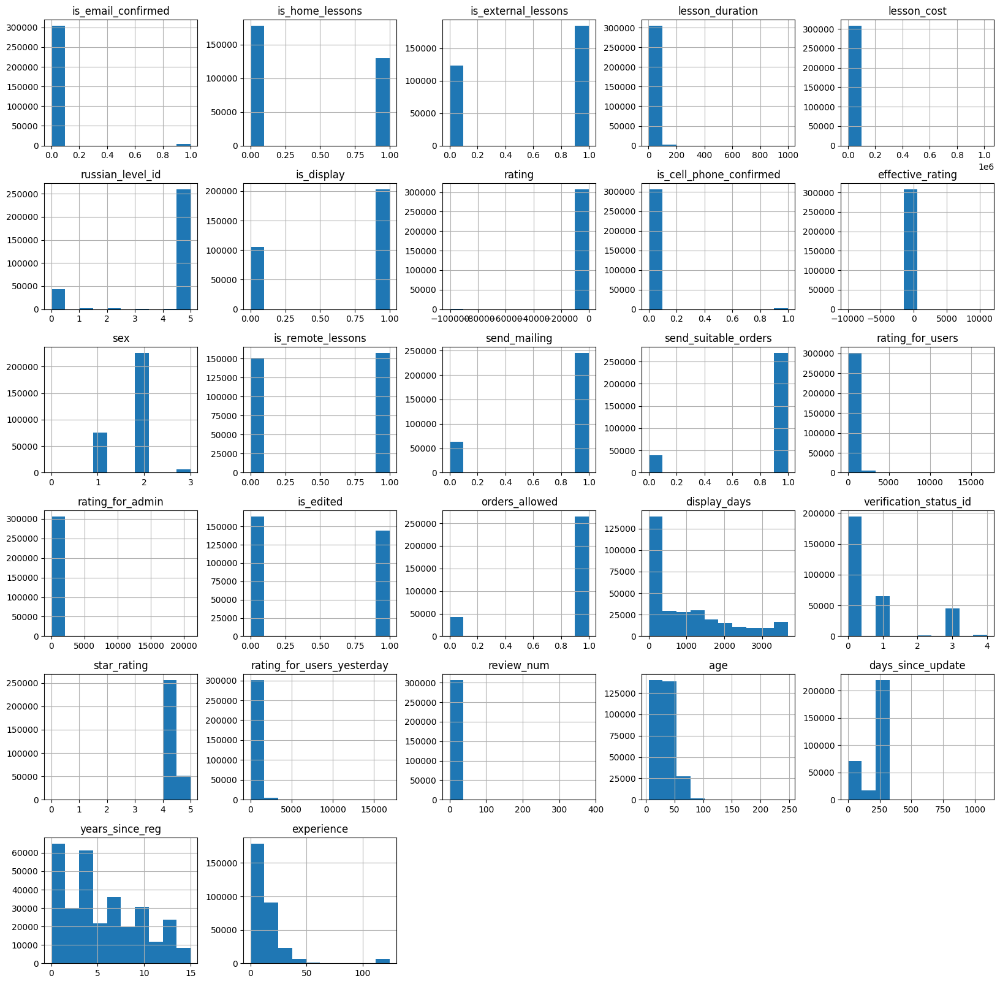

In [32]:
teachers_info.drop('id', axis=1).hist(figsize=(20, 20), layout=(-1, 5))
plt.show()

Видим, что у бинарных признаков is_email_confirmed и is_cell_phone_confirmed практически отсутствуют значения 1. Таким образом, данные признаки бесполезны, можем их тоже удалить.

In [33]:
teachers_info = teachers_info.drop(['is_email_confirmed', 'is_cell_phone_confirmed'], axis=1)

Заметны выбросы в полях lesson_duration, lesson_cost, rating, rating_for_users, rating_for_admin, rating_for_users_yesterday, review_num, age, days_since_update, experience.

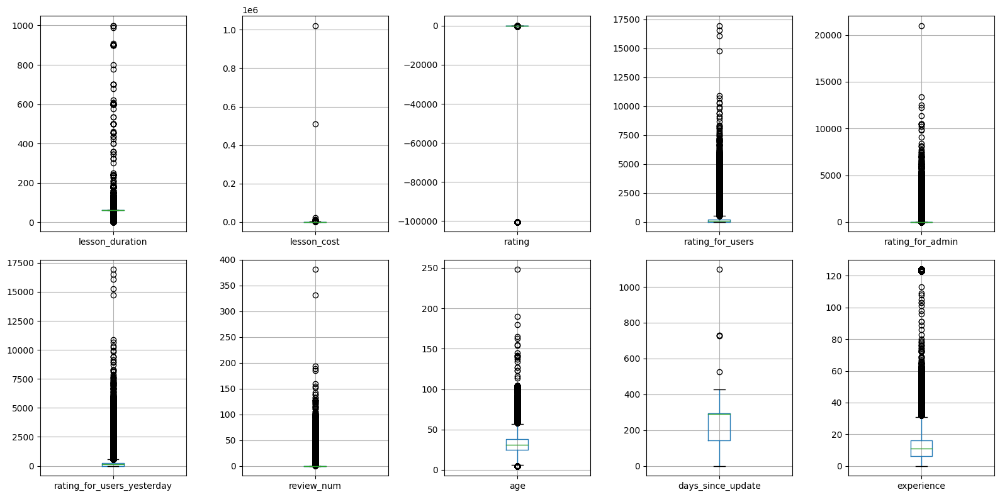

In [34]:
num_cols = ['lesson_duration', 
               'lesson_cost', 
            'rating',
            'rating_for_users',
            'rating_for_admin',
            'rating_for_users_yesterday',
            'review_num',
            'age',
            'days_since_update',
            'experience'
           ]

# Создаем сетку для диаграмм
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(16, 8))
plt.subplots_adjust(wspace=0.5, hspace=0.5)

for i, feature in enumerate(num_cols):
    row = i // 5
    col = i % 5
    ax = axes[row, col]
    
    # Создаем боксплот для текущего признака
    teachers_info.boxplot(column=feature, ax=ax)

plt.tight_layout()
plt.show()

Скорректируем те данные, в которых явно неправдоподобные значения: lesson_cost, age, experience.

In [35]:
#функция для корректировки аномальных данных методом межквантильного расстояния
def iqr(df, columns):
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - (2.5 * IQR)
        upper = Q3 + (2.5 * IQR)        
        df[col] = df[col].clip(lower, upper)

In [36]:
iqr(teachers_info, ['lesson_cost', 'age', 'experience'])

### suitable_teachers

In [37]:
dataframe_info(suitable_teachers)

Размер: (20271186, 5)


,teacher_id,order_id,contact_result,enable_auto_assign,enable_assign
0,82583,1742711,Репетитор согласился,1,1
1,125057,1742713,"Репетитор положил трубку, либо обрыв связи (Ok...",0,0
2,231211,1742713,"Репетитор положил трубку, либо обрыв связи (Ok...",0,0
3,128773,1742713,"Репетитор положил трубку, либо обрыв связи (Ok...",0,0
4,63019,1742713,Репетитор согласился,0,1


Info:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20271186 entries, 0 to 20271185
Data columns (total 5 columns):
 #   Column              Dtype   
---  ------              -----   
 0   teacher_id          int32   
 1   order_id            int32   
 2   contact_result      category
 3   enable_auto_assign  int8    
 4   enable_assign       int8    
dtypes: category(1), int32(2), int8(2)
memory usage: 232.3 MB

Пропущенные значения:
 teacher_id                   0
order_id                     0
contact_result        12824362
enable_auto_assign           0
enable_assign                0
dtype: int64

Дубликаты:
 49


In [38]:
suitable_teachers = suitable_teachers.drop_duplicates()

В столбце contact_result более половины пропущенных данных, а в тех, что заполнены - чаще всего неинформативная информация. Кроме того, эта информация касается уже совершенного контакта с консультантом, то есть не актуально для новых заявок. Можем удалить этот столбец.

In [39]:
suitable_teachers = suitable_teachers.drop('contact_result', axis=1)

### Сокращение размерности таблиц

In [40]:
# функция сокращения размерности таблиц

def reduce_mem_usage(df):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.        
    """
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        col_type = df[col].dtype
        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)


    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))

In [41]:
reduce_mem_usage(orders)
reduce_mem_usage(teachers_info)
reduce_mem_usage(suitable_teachers)

Memory usage of dataframe is 144.25 MB
Memory usage after optimization is: 112.44 MB
Decreased by 22.0%
Memory usage of dataframe is 20.85 MB
Memory usage after optimization is: 12.63 MB
Decreased by 39.4%
Memory usage of dataframe is 347.98 MB
Memory usage after optimization is: 347.98 MB
Decreased by 0.0%


## Объединение таблиц

Объединим таблицы suitable_teachers и teachers_info.

In [42]:
suitable_teachers = suitable_teachers.merge(teachers_info, how='left', left_on='teacher_id', right_on='id')
suitable_teachers = suitable_teachers.dropna()
suitable_teachers = suitable_teachers.drop('id', axis=1)

In [43]:
suitable_teachers.shape

(20271135, 29)

In [44]:
del teachers_info

In [45]:
numeric_cols = ['experience', 'years_since_reg', 'days_since_update', 'age', 
               'rating_for_users_yesterday', 'display_days', 'rating_for_admin', 'rating_for_users',
               'effective_rating', 'rating', 'lesson_cost']

categor_cols = list(set(suitable_teachers.columns) - set(numeric_cols) - set(['teacher_id', 'order_id']))

In [46]:
# переведем категориальные признаки в int

suitable_teachers[categor_cols] = suitable_teachers[categor_cols].astype(int)

In [47]:
reduce_mem_usage(suitable_teachers)

Memory usage of dataframe is 3789.08 MB
Memory usage after optimization is: 1121.26 MB
Decreased by 70.4%


Сгруппируем учителей по order_id, чтобы затем присоединить агрегированные данные по учителям к таблице orders.

In [48]:
for i in tqdm(range(100)):

# Группировка данных
    teachers_group_by_orders = suitable_teachers.groupby('order_id').agg({**{col: 'mean' for col in numeric_cols},
                                     **{col: 'median' for col in categor_cols}
                                                                     })

100%|██████████| 100/100 [26:29<00:00, 15.90s/it]


In [49]:
teachers_group_by_orders.info()

<class 'pandas.core.frame.DataFrame'>
Index: 842019 entries, 1742638 to 2946699
Data columns (total 27 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   experience                  842019 non-null  float32
 1   years_since_reg             842019 non-null  float32
 2   days_since_update           842019 non-null  float32
 3   age                         842019 non-null  float32
 4   rating_for_users_yesterday  842019 non-null  float32
 5   display_days                842019 non-null  float32
 6   rating_for_admin            842019 non-null  float32
 7   rating_for_users            842019 non-null  float32
 8   effective_rating            842019 non-null  float32
 9   rating                      842019 non-null  float32
 10  lesson_cost                 842019 non-null  float32
 11  is_home_lessons             842019 non-null  float64
 12  russian_level_id            842019 non-null  float64
 13  star_rating 

In [50]:
teachers_group_by_orders[categor_cols] = teachers_group_by_orders[categor_cols].astype(int)

In [ ]:
teachers_group_by_orders.hist(figsize=(20, 20), layout=(-1, 5))
plt.show()

После группировки еще несколько категориальных признаков потеряли свою значимость из-за несбалансированности, можем их удалить: is_display, orders_allowed, send_suitable_orders, russial_level_id, send_mailing.

In [ ]:
teachers_group_by_orders = teachers_group_by_orders.drop(['is_display', 
                                                          'orders_allowed', 
                                                          'send_suitable_orders', 
                                                          'russian_level_id', 
                                                          'send_mailing'], axis=1)

Объединим данные по учителям и по заказам в общий датасет.

In [53]:
data = orders.merge(teachers_group_by_orders, how='inner', left_on='id', right_on='order_id')

In [54]:
dataframe_info(data)

Размер: (833050, 47)


,id,order_date,subject_id,purpose,lesson_price,lesson_duration_x,add_info,planned_lesson_number,pupil_category_new_id,lessons_per_week,minimal_price,teacher_sex,teacher_experience_from,teacher_experience_to,lesson_place_new,pupil_knowledgelvl,teacher_age_from,teacher_age_to,chosen_teachers_only,no_teachers_available,source_id,original_order_id,is_display_to_teachers,is_paid,target,experience,years_since_reg,days_since_update,age,rating_for_users_yesterday,display_days,rating_for_admin,rating_for_users,effective_rating,rating,lesson_cost,is_home_lessons,star_rating,verification_status_id,lesson_duration_y,enable_auto_assign,is_edited,is_external_lessons,enable_assign,sex,is_remote_lessons,review_num
0,2294056,2022-11-01 00:04:01.563,21.0,Разделы: начертательная геометрия.\nКатегория ...,800,60,Место проведения занятий: дистанционно (наприм...,7,14.0,2,0,3,0.0,0.0,4,0,0,0,0,0,23,2294056.0,1,0,0,28.799999,5.600000,1.200000,57.099998,1132.599976,2135.300049,309.024994,1072.500000,0.000000,6.400000,574.000000,1,4,3,60,0,1,1,0,2,1,29
1,2294057,2022-11-01 00:08:47.237,8.0,Разделы: школьный курс.\nКатегория ученика: ш...,700,60,Место проведения занятий: дистанционно (наприм...,10,10.0,3,0,3,5.0,0.0,4,0,20,90,0,0,14,2293804.0,1,0,0,27.000000,6.000000,9.000000,59.333332,588.333313,2229.500000,93.291664,588.333313,0.000000,6.666667,700.000000,1,5,1,60,0,1,0,0,2,1,8
2,2294071,2022-11-01 00:43:22.940,21.0,Разделы: ораторское искусство.\nКатегория учен...,3000,60,Место проведения занятий: дистанционно (наприм...,10,14.0,5,2000,3,0.0,0.0,4,0,0,0,0,0,23,2294071.0,1,0,0,17.500000,7.000000,0.642857,41.821430,2745.214355,2293.071533,781.232117,2722.642822,1.471401,6.214286,1796.428589,1,4,3,60,1,1,1,0,1,1,17
3,2294072,2022-11-01 00:45:46.343,8.0,Разделы: школьный курс.\nКатегория ученика: ш...,1500,60,Район: м. Перово.\nМесто проведения занятий: у...,10,9.0,2,0,3,0.0,0.0,1,0,0,0,0,0,23,2294072.0,1,0,0,16.428572,7.928571,129.000000,38.571430,871.178589,2583.464355,656.008911,865.571411,1.888672,-7174.571289,967.857117,0,4,1,60,0,1,1,0,2,1,1
4,2294073,2022-11-01 01:01:18.983,9.0,Разделы: теоретическая механика.\nКатегория уч...,1500,60,Район: м. Ломоносовская.\nМесто проведения зан...,1,14.0,2,0,3,0.0,0.0,2,0,0,0,0,0,23,2294073.0,1,0,0,40.500000,7.500000,146.500000,70.500000,899.000000,2888.000000,156.562500,749.000000,0.000000,6.000000,900.000000,0,4,2,60,1,1,0,0,1,0,34


Info:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 833050 entries, 0 to 833049
Data columns (total 47 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   id                          833050 non-null  int32  
 1   order_date                  833050 non-null  object 
 2   subject_id                  833008 non-null  float32
 3   purpose                     831994 non-null  object 
 4   lesson_price                833050 non-null  int32  
 5   lesson_duration_x           833050 non-null  int32  
 6   add_info                    832334 non-null  object 
 7   planned_lesson_number       833050 non-null  int32  
 8   pupil_category_new_id       829218 non-null  float32
 9   lessons_per_week            833050 non-null  int32  
 10  minimal_price               833050 non-null  int32  
 11  teacher_sex                 833050 non-null  int32  
 12  teacher_experience_from     833050 non-null  float32
 13  teacher

#### Обработка пропусков

In [55]:
data['pupil_category_new_id'] = data['pupil_category_new_id'].fillna(-1)
data = data.dropna()

In [56]:
del teachers_group_by_orders

## EDA

In [57]:
num_features = ['lesson_price', 'minimal_price', 'teacher_experience_from', 'teacher_experience_to', 
                'teacher_age_from', 'teacher_age_to', 'experience', 'years_since_reg', 'days_since_update', 'age',
               'rating_for_users_yesterday', 'display_days', 'rating_for_admin', 'rating_for_users',
               'effective_rating', 'rating', 'lesson_cost', 'review_num', 'lesson_duration_x',
               'lesson_duration_y']

text_features = ['purpose', 'add_info']

cat_features = ['planned_lesson_number', 'is_display_to_teachers','star_rating',
 'source_id',
 'is_edited',
 'subject_id',
 'is_external_lessons',
 'verification_status_id',
 'teacher_sex',
 'sex',
 'no_teachers_available',
 'is_remote_lessons',
 'pupil_category_new_id',
 'pupil_knowledgelvl',
 'lessons_per_week',
 'chosen_teachers_only',
 'enable_assign',
 'lesson_place_new',
 'enable_auto_assign',
 'is_home_lessons',
 ]

Посмотрим на качественные признаки и их распределение относительно таргета.

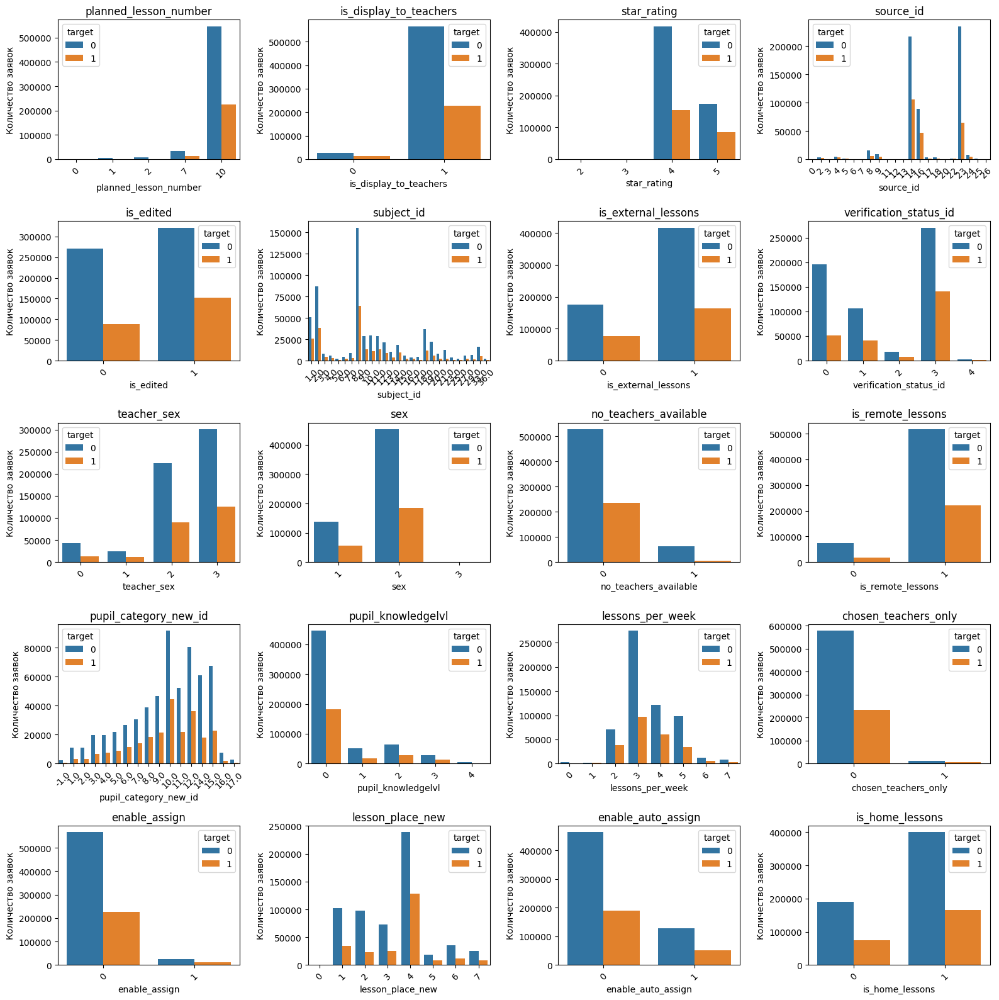

In [58]:
# Создаем сетку для диаграмм
fig, axes = plt.subplots(nrows=5, ncols=4, figsize=(16, 16))
plt.subplots_adjust(wspace=0.5, hspace=0.5)

for i, feature in enumerate(cat_features):
    row = i // 4
    col = i % 4
    ax = axes[row, col]
    
    # Создаем столбчатую диаграмму для текущего категориального признака
    sns.countplot(x=feature, hue='target', data=data, ax=ax)
    
    #ax.set_xlabel(feature)
    ax.set_ylabel('Количество заявок')
    ax.set_title(f'{feature}')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
plt.tight_layout()
plt.show()

По признаку no_teachers_available явно видим, что при отсутствии доступных учителей заявки в основном остаются неоплаченные.

Посмотрим на количественные признаки и их распределение относительно таргета.

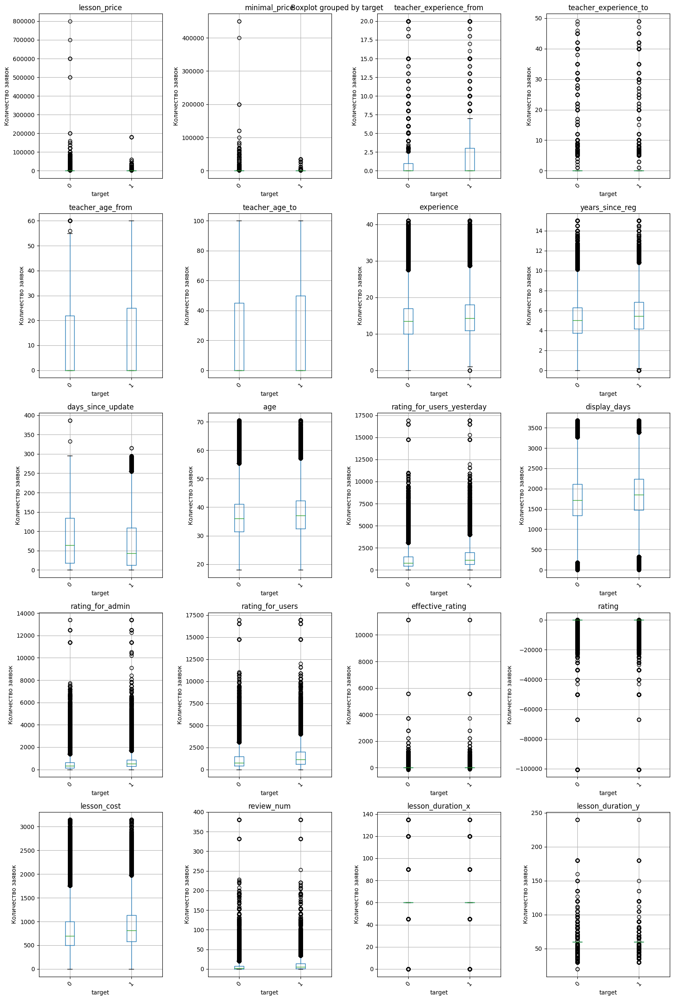

In [59]:
fig, axes = plt.subplots(nrows=5, ncols=4, figsize=(16, 24))
plt.subplots_adjust(wspace=0.5, hspace=0.5)

for i, feature in enumerate(num_features):
    row = i // 4
    col = i % 4
    ax = axes[row, col]
    
    # Создаем boxplot для текущего количественного признака
    data.boxplot(column=feature, by='target', ax=ax)
    
    #ax.set_xlabel(feature)
    ax.set_ylabel('Количество заявок')
    ax.set_title(f'{feature}')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
plt.tight_layout()
plt.show()

Выбросы мешают анализу, для EDA очистим датасет от аномальных значений и затем изучим зависимости.

In [60]:
#функция для вычленения аномальных данных методом межквантильного расстояния
def iqr(df, columns):
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - (1.5 * IQR)
        upper = Q3 + (1.5 * IQR)        
        df[col] = df[col].clip(lower, upper)

In [61]:
import copy

data_clean = copy.deepcopy(data)
iqr(data_clean, num_features)

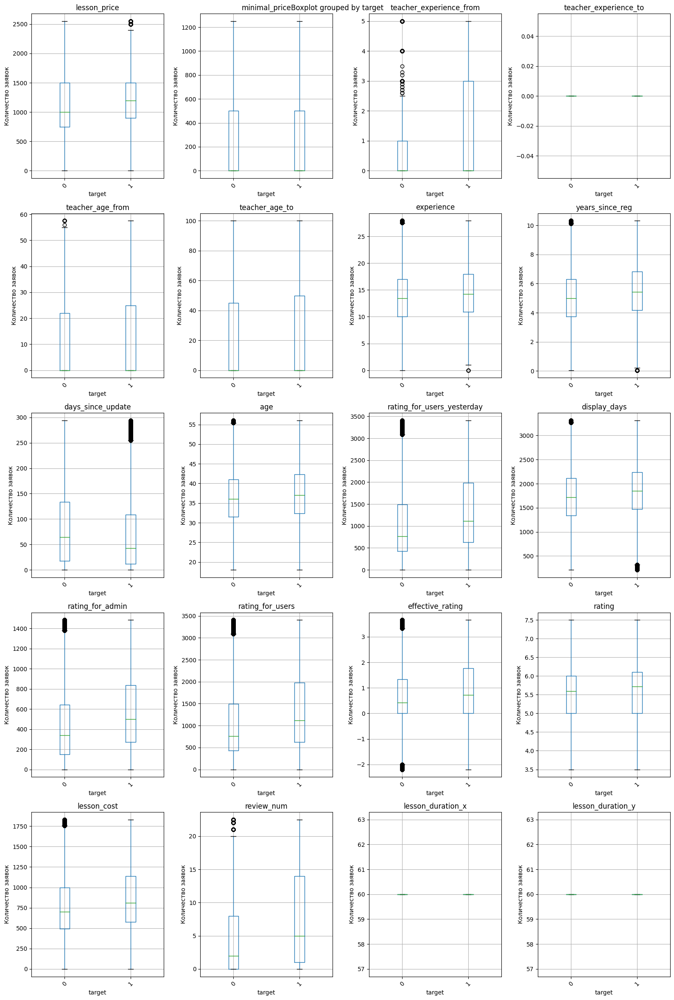

In [62]:
fig, axes = plt.subplots(nrows=5, ncols=4, figsize=(16, 24))
plt.subplots_adjust(wspace=0.5, hspace=0.5)

for i, feature in enumerate(num_features):
    row = i // 4
    col = i % 4
    ax = axes[row, col]
    
    # Создаем boxplot для текущего количественного признака
    data_clean.boxplot(column=feature, by='target', ax=ax)
    
    #ax.set_xlabel(feature)
    ax.set_ylabel('Количество заявок')
    ax.set_title(f'{feature}')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
plt.tight_layout()
plt.show()

Есть смысл обратить внимание на колонки lesson_price, 'teacher_experience_from', 'days_since_update', 'rating_for_users_yesterday', 'rating_for_admin', 'rating_for_users', 'effective_rating', 'review_num', 'lesson_cost'.

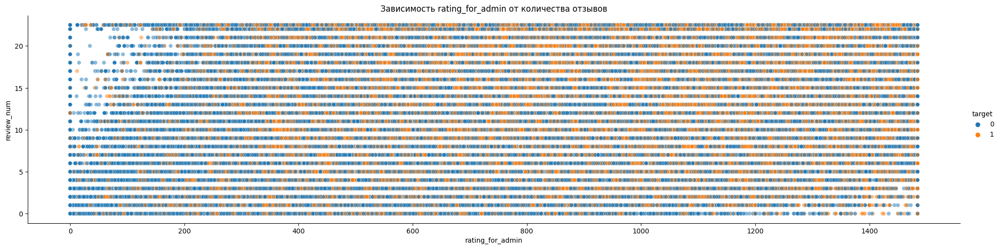

In [63]:
g = sns.relplot(data=data_clean,
                x='rating_for_admin',
                y='review_num',
                hue='target',
                kind='scatter',
                aspect=4,
                alpha=0.5)
plt.title('Зависимость rating_for_admin от количества отзывов')
plt.show()

По графику видим, что чем меньше отзывов и ниже рейтинг, тем больше вероятность неоплаченной заявки, а с увеличением рейтинга и количества отзывов количество оплаченных заявок растет. Поделим рейтинг на количество отзывов - так мы получим признак качества одного отзыва. То же самое можем сделать с 'rating_for_users_yesterday', 'rating_for_users', 'effective_rating'.

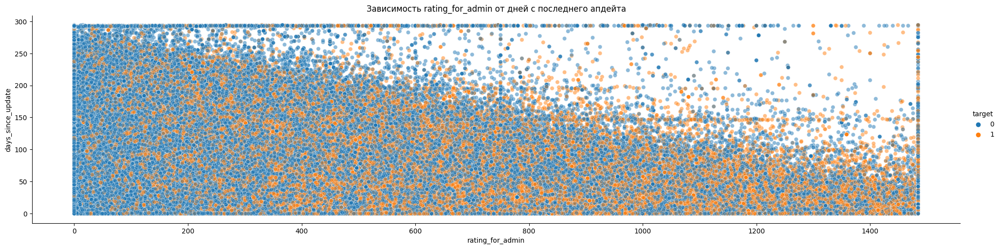

In [64]:
g = sns.relplot(data=data_clean,
                x='rating_for_admin',
                y='days_since_update',
                hue='target',
                kind='scatter',
                aspect=4,
                alpha=0.5)
plt.title('Зависимость rating_for_admin от дней с последнего апдейта')
plt.show()

Здесь тоже видна закономерность: чем выше рейтинг,  тем меньше дней с последнего апдейта прошло. То есть учителя с высоким рейтингом - более активные пользователи платформы. Можем попробовать создать признак рейтинга деленный на количество дней с апдейта. То же самое можем сделать с 'rating_for_users_yesterday', 'rating_for_users', 'effective_rating'.

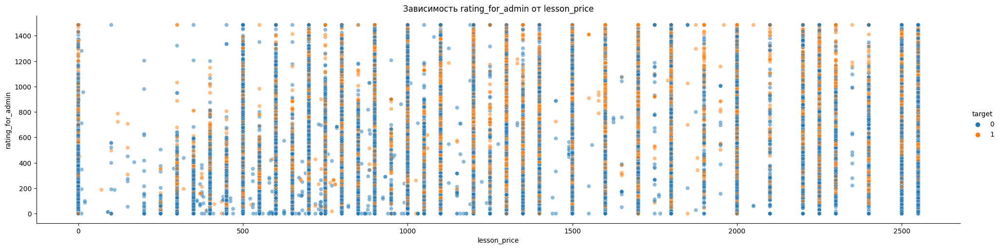

In [65]:
g = sns.relplot(data=data_clean,
                x='lesson_price',
                y='rating_for_admin',
                hue='target',
                kind='scatter',
                aspect=4,
                alpha=0.5)
plt.title('Зависимость rating_for_admin от lesson_price')
plt.show()

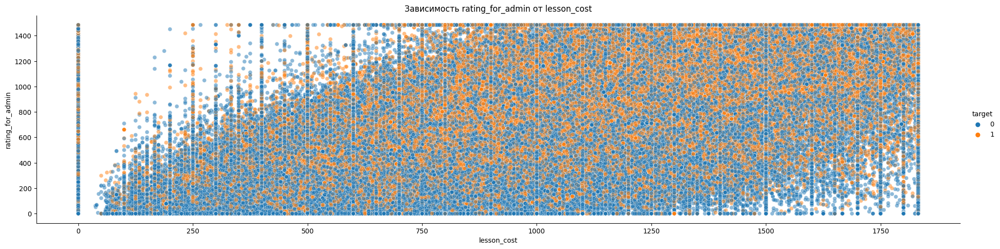

In [66]:
g = sns.relplot(data=data_clean,
                x='lesson_cost',
                y='rating_for_admin',
                hue='target',
                kind='scatter',
                aspect=4,
                alpha=0.5)
plt.title('Зависимость rating_for_admin от lesson_cost')
plt.show()

Видны закономерности в зависимости рейтинга и цены (lesson_cost и lesson_price): добавим признаки rating_for_admin/lesson_cost и rating_for_admin/lesson_price.

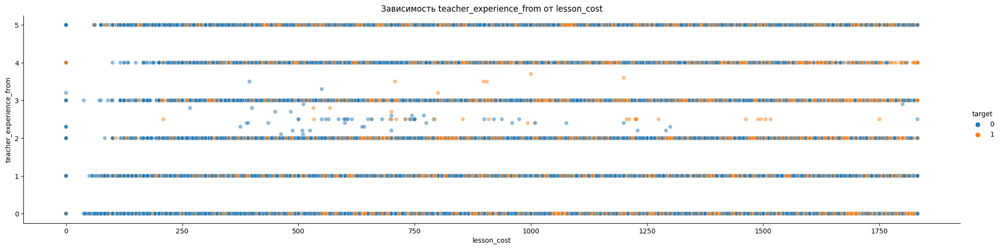

In [67]:
g = sns.relplot(data=data_clean,
                x='lesson_cost',
                y='teacher_experience_from',
                hue='target',
                kind='scatter',
                aspect=4,
                alpha=0.5)
plt.title('Зависимость teacher_experience_from от lesson_cost')
plt.show()

Не видим каких-либо зависимостей от опыта и стоимости.

In [68]:
del data_clean

### Корреляция признаков

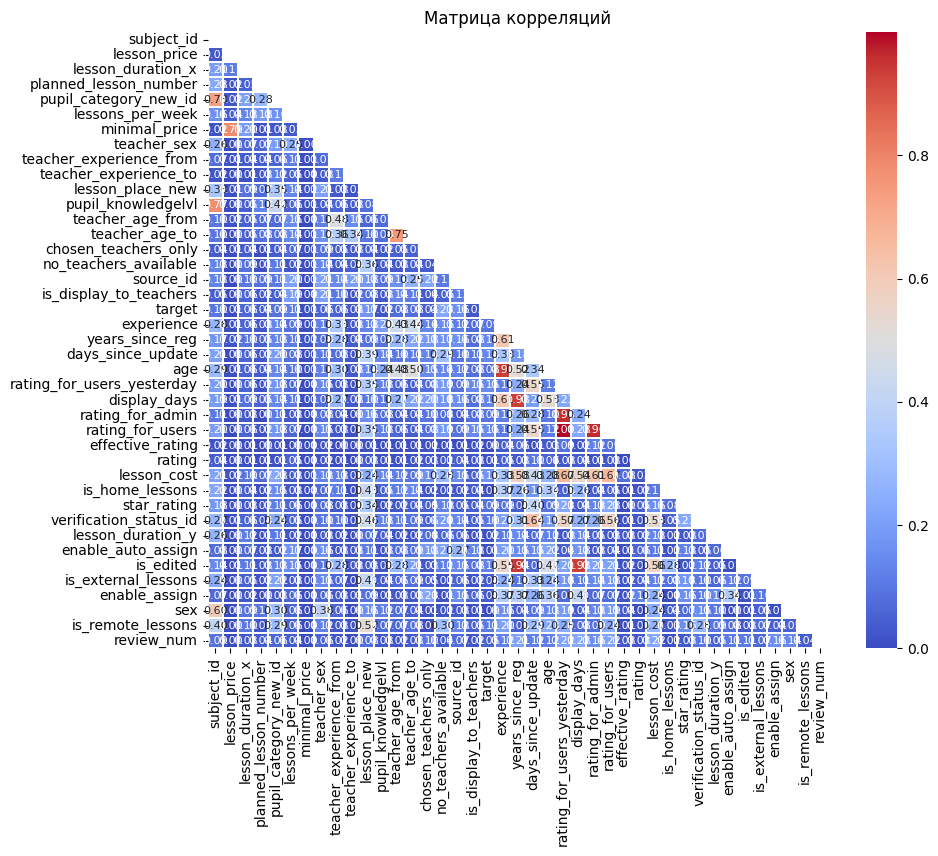

CPU times: user 1min 8s, sys: 4.38 s, total: 1min 13s
Wall time: 1min 26s


In [69]:
%%time
corr_data = data.drop(['id', 'is_paid', 'order_date', 'add_info', 'purpose', 'original_order_id'], 
                        axis=1).phik_matrix(interval_cols=num_features)

plt.figure(figsize=(10, 8))
mask = np.triu(np.ones_like(corr_data, dtype=bool))
sns.heatmap(corr_data, mask=mask, annot=True, cmap="coolwarm", fmt=".2f", annot_kws={"size": 8}, linewidths=0.2)

plt.title("Матрица корреляций")
plt.xticks(rotation=90)
plt.show()

Видим, что признаки в большинстве своем слабо коррелируют между собой. Высокая корреляция у рейтингов. Таргет ни с какими признаками не коррелирует.

## Генерация признаков

Создадим признак - количество подходящих учителей на заявку.

In [70]:
# Подсчет количества подходящих учителей для каждого order_id
teacher_counts = suitable_teachers.groupby('order_id')['teacher_id'].count()

# Создание нового столбца в data, где каждому order_id сопоставляется количество подходящих учителей
data['suitable_teachers'] = data['id'].map(teacher_counts)

# Заполнение нулями для order_id, для которых не найдены подходящие учителя
data['suitable_teachers'] = data['suitable_teachers'].fillna(0)

In [71]:
del suitable_teachers

In [72]:
def add_division_features(data, feature_pairs):
    """
    Функция добавляет новые признаки в DataFrame путем деления одного столбца на другой.
    
    Parameters:
    - data: pd.DataFrame, исходный набор данных.
    - feature_pairs: list of tuples, список кортежей, где каждый кортеж содержит пару названий столбцов
                     (делимое, делитель) и название нового признака.
    
    Returns:
    None, функция изменяет переданный DataFrame на месте.
    """
    for numerator, denominator, new_feature_name in feature_pairs:
        # Создание нового признака путем деления одного столбца на другой
        # с проверкой делителя на ноль
        data[new_feature_name] = data[numerator] / data[denominator]

In [73]:
# Определение пар столбцов для создания новых признаков
feature_pairs = [
    ('rating_for_admin', 'review_num', 'rating_admin_per_review'),
    ('rating_for_users', 'review_num', 'rating_users_per_review'),
    ('rating_for_admin', 'lesson_price', 'rating_admin_per_price'),
    ('rating_for_users_yesterday', 'lesson_price', 'rating_users_yest_per_price'),
    ('rating_for_users', 'lesson_cost', 'rating_users_per_cost'),
    ('effective_rating', 'lesson_cost', 'eff_rating_per_cost'),
    ('rating_for_admin', 'days_since_update',  'rating_admin_per_update'),
    ('rating_for_users', 'days_since_update',  'rating_users_per_update')
]

# Добавление новых признаков в набор данных
add_division_features(data, feature_pairs)

- Функции для обработки текстовых признаков

### Обработка текстовых признаков

#### Лемматизация

In [74]:
# очищаем текстовые признаки от ненужных знаков

def clear_text(text):
    return ' '.join(re.sub(r'[^а-яА-ЯёЁ ]', ' ', text).split())

data['clean_purpose'] = data['purpose'].progress_apply(clear_text)
data['clean_add_info'] = data['add_info'].progress_apply(clear_text)

100%|██████████| 831839/831839 [00:17<00:00, 46354.07it/s]


In [76]:
# лемматизируем очищенные текстовые признаки

def lemmatize_text_column(data, text_column_name, batch_size=1000):
    corpus = data[text_column_name].values.astype('U')
    total_texts = len(corpus)
    processed_texts = []

    with tqdm(total=total_texts, desc="Lemmatizing texts") as pbar:
        for i in range(0, len(corpus), batch_size):
            batch = corpus[i:i + batch_size]
            lemmatized_batch = lemmatize_batch(batch)
            processed_texts.extend(lemmatized_batch)
            pbar.update(len(batch))

    data[text_column_name] = processed_texts
    return data

def lemmatize_batch(texts):
    m = Mystem()
    lemmatized_texts = []
    for text in texts:
        lemmatized = m.lemmatize(text)
        lemmatized_texts.append(''.join(lemmatized).strip())
    return lemmatized_texts

# Применяем лемматизацию для текстовых признаков
data = lemmatize_text_column(data, 'clean_purpose')
data = lemmatize_text_column(data, 'clean_add_info')

Lemmatizing texts: 100%|██████████| 831839/831839 [33:34<00:00, 412.98it/s]


In [ ]:
# data.reset_index().to_feather('data_fin.feather')

#### TF-IDF и LSA

Осуществим LSA (скрытый семантический анализ) с помощью TruncatedSVD и получим вместо разреженной матрицы tf-idf пространство низкой размерности - для каждого из текстовых признаков извлечем 3 уплотненных признака.

In [77]:
# функция для tf-idf и получения уплотненных признаков

def fit_transform_features(X_train, text_columns=['clean_purpose', 'clean_add_info'], n_components=3, n_iter=7, min_df=10, stop_words=None, ngram_range=(1, 2)):
    transformers = {}
    
    for column in text_columns:
        # Применение TF-IDF
        tf_idf = TfidfVectorizer(min_df=min_df, stop_words=stop_words, ngram_range=ngram_range)
        tf_idf_matrix_train = tf_idf.fit_transform(X_train[column])
        
        # Применение SVD
        svd = TruncatedSVD(n_components=n_components, n_iter=n_iter, random_state=42)
        svd_features_train = svd.fit_transform(tf_idf_matrix_train)
        
        # Список названий новых признаков
        feature_names = [f'svd_{column}_{i+1}' for i in range(n_components)]
        
        # Функция для объединения исходного DataFrame с преобразованными признаками.
        def concat_transformed_features(original_data, transformed_data, feature_names):

            # Преобразование массива в DataFrame с заданными названиями столбцов
            transformed_df = pd.DataFrame(transformed_data, columns=feature_names)
    
            # Сброс индексов для обоих DataFrame для избежания несовпадения индексов при объединении
            original_data_reset = original_data.reset_index(drop=True)
            transformed_df_reset = transformed_df.reset_index(drop=True)
    
            # Объединение исходных данных с преобразованными
            combined_data = pd.concat([original_data_reset, transformed_df_reset], axis=1)
    
            return combined_data
        
        # Добавление новых признаков к исходным данным
        X_train = concat_transformed_features(X_train, svd_features_train, feature_names)
        
        # Сохраняем трансформеры для последующего использования
        transformers[column] = (tf_idf, svd)
    
    X_train = X_train.drop(text_columns, axis=1)
    
    return X_train, transformers

In [78]:
# функция для тестовых данных для получения уплотненных признаков

def transform_features(X, transformers, text_columns=['clean_purpose', 'clean_add_info']):
    for column in text_columns:
        # Извлекаем сохраненные трансформеры
        tf_idf, svd = transformers[column]
        
        # Применение TF-IDF и SVD
        tf_idf_matrix = tf_idf.transform(X[column])
        svd_features = svd.transform(tf_idf_matrix)
        
        # Список названий новых признаков
        feature_names = [f'svd_{column}_{i+1}' for i in range(svd.n_components)]
        
        # Функция для объединения исходного DataFrame с преобразованными признаками.
        def concat_transformed_features(original_data, transformed_data, feature_names):

            # Преобразование массива в DataFrame с заданными названиями столбцов
            transformed_df = pd.DataFrame(transformed_data, columns=feature_names)
    
            # Сброс индексов для обоих DataFrame для избежания несовпадения индексов при объединении
            original_data_reset = original_data.reset_index(drop=True)
            transformed_df_reset = transformed_df.reset_index(drop=True)
    
            # Объединение исходных данных с преобразованными
            combined_data = pd.concat([original_data_reset, transformed_df_reset], axis=1)
    
            return combined_data
        
        # Добавление новых признаков к исходным данным
        X = concat_transformed_features(X, svd_features, feature_names)
    
    X = X.drop(text_columns, axis=1)
    
    return X

## Обучение моделей

In [79]:
X_train, X_test, y_train, y_test = train_test_split(
    data.drop(['id', 'target', 'is_paid',
               'order_date', 'original_order_id'], axis=1), data.target, stratify=data.target,
    test_size=0.2, random_state=42)

In [80]:
text_features = ['purpose', 'add_info']

cat_features = ['planned_lesson_number', 'is_display_to_teachers','star_rating',
 'source_id',
 'is_edited',
 'subject_id',
 'is_external_lessons',
 'verification_status_id',
 'teacher_sex',
 'sex',
 'no_teachers_available',
 'is_remote_lessons',
 'pupil_category_new_id',
 'pupil_knowledgelvl',
 'lessons_per_week',
 'chosen_teachers_only',
 'enable_assign',
 'lesson_place_new',
 'enable_auto_assign',
 'is_home_lessons',
 ]

In [81]:
X_train[cat_features] = X_train[cat_features].astype(int)
X_test[cat_features] = X_test[cat_features].astype(int)

In [82]:
%%time

n_splits = 3
targets = ['target']
clfs = []
scores = []
kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
for train_index, test_index in kf.split(X_train, y_train):  # Указываем y_train для стратификации

    X_training, X_val = X_train.iloc[train_index], X_train.iloc[test_index]
    y_training, y_val = y_train.iloc[train_index], y_train.iloc[test_index]
    
    # Обучаем преобразователи для текстов на X_train и преобразуем X_train
    X_training, transformers = fit_transform_features(X_training)

    # Применяем обученные преобразователи к X_val
    X_val = transform_features(X_val, transformers)

    train_dataset = Pool(data=X_training, label=y_training, cat_features=cat_features, text_features=text_features)
    eval_dataset = Pool(data=X_val, label=y_val, cat_features=cat_features, text_features=text_features)

    clf = CatBoostClassifier(random_seed=42,
                        thread_count=-1,
                        use_best_model=True,
                             eval_metric='AUC',
                        cat_features=cat_features,
                        text_features=text_features,
                        colsample_bylevel = 0.1,
                        subsample = 0.95,
                        bootstrap_type='Bernoulli',
                             auto_class_weights='Balanced',
                             iterations=2000,
                             early_stopping_rounds=1000,
                            verbose=300)

    clfs.append(clf)

    clf.fit(train_dataset, eval_set=eval_dataset, verbose=300, use_best_model=True, plot=False)

    scores.append(clf.get_best_score()['validation']['AUC'])

print('mean ROC AUC score --------->', np.mean(scores))

Learning rate set to 0.105628
0:	test: 0.6121809	best: 0.6121809 (0)	total: 2.04s	remaining: 1h 8m
300:	test: 0.7089807	best: 0.7089807 (300)	total: 9m 40s	remaining: 54m 39s
900:	test: 0.7244002	best: 0.7244002 (900)	total: 28m 21s	remaining: 34m 35s
1200:	test: 0.7298493	best: 0.7298493 (1200)	total: 37m 36s	remaining: 25m 1s
1500:	test: 0.7349909	best: 0.7349909 (1500)	total: 46m 50s	remaining: 15m 34s
1800:	test: 0.7396255	best: 0.7396255 (1800)	total: 56m 5s	remaining: 6m 11s
1999:	test: 0.7423883	best: 0.7424089 (1997)	total: 1h 2m 17s	remaining: 0us

bestTest = 0.7424088911
bestIteration = 1997

Shrink model to first 1998 iterations.
Learning rate set to 0.105628
0:	test: 0.6164046	best: 0.6164046 (0)	total: 2.04s	remaining: 1h 7m 59s
300:	test: 0.7099711	best: 0.7099711 (300)	total: 9m 38s	remaining: 54m 25s
600:	test: 0.7185875	best: 0.7185875 (600)	total: 18m 58s	remaining: 44m 9s
900:	test: 0.7254413	best: 0.7254413 (900)	total: 28m 20s	remaining: 34m 34s
1200:	test: 0.73086

In [83]:
# важность признаков

fi = clf.get_feature_importance(prettified=True)
fi

,Feature Id,Importances
0,add_info,30.469604
1,purpose,21.451729
2,no_teachers_available,7.955261
3,source_id,3.156618
4,rating_admin_per_price,2.659339
5,rating_for_admin,2.008906
6,rating_admin_per_update,1.871620
7,suitable_teachers,1.629353
8,pupil_category_new_id,1.558428
9,rating_admin_per_review,1.508475


Видим, что половина признаков не несет практически никакой роли.

In [84]:
# Обучаем трансформеры на X_train и преобразуем X_train
X_train, transformers = fit_transform_features(X_train)

# Применяем обученные трансформеры к X_test
X_test = transform_features(X_test, transformers)

Всего признаков 57 Усреднение по 3 моделям: 
На график нанесено топ-13 признаков


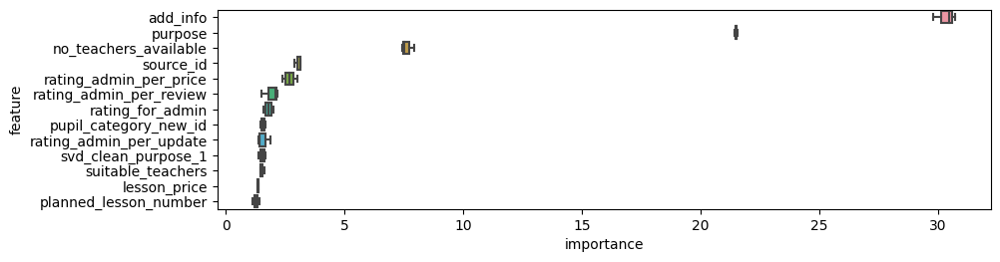

In [85]:
def plot_importance(df, best_model, height = 0.2, top_n=50):

    fi = pd.DataFrame(index=df.columns, columns=[])
    for i, m in enumerate(best_model):
        fi[f"m_{i}"] = m.get_feature_importance()

    fi = fi.stack().reset_index().iloc[:, [0, 2]]  # .to_frame()
    fi.columns = ["feature", "importance"]

    cols_ord = list(fi.groupby("feature")["importance"].mean().sort_values(ascending=False).index)

    print("Всего признаков {} Усреднение по {} моделям: ".format(len(cols_ord), len(best_model)))
    cols_ord = cols_ord[:top_n]

    fi = fi[fi["feature"].isin(cols_ord)]

    plt.figure(figsize=(10, len(cols_ord) * height))
    b = sns.boxplot(data=fi, y="feature", x="importance", orient="h", order=cols_ord)

    print("На график нанесено топ-{} признаков".format(top_n))
    return (
        fi.groupby(by=["feature"], as_index=False)["importance"]
        .mean()
        .sort_values(by="importance", ascending=False))


df_feats_imp = plot_importance(
    X_train,
    best_model = clfs,
    height = 0.20,
    top_n=13,
)

Сократим количество признаков до 25 и обучим на них модель.

In [86]:
useful_cols = list(fi['Feature Id'][:25])
X_train_small = X_train[useful_cols]
X_test_small = X_test[useful_cols]

In [87]:
category_features = list(X_train_small.columns[(X_train_small.dtypes == 'int64')])

In [88]:
train_dataset = Pool(data=X_train_small, label=y_train, cat_features=category_features, text_features=text_features)
eval_dataset = Pool(data=X_test_small, label=y_test, cat_features=category_features, text_features=text_features)

clf = CatBoostClassifier(random_seed=42,
                        thread_count=-1,
                        use_best_model=True,
                             iterations=2000,
                             eval_metric='AUC',
                        cat_features=category_features,
                        text_features=text_features,
                        colsample_bylevel = 0.1,
                        subsample = 0.95,
                        bootstrap_type='Bernoulli',
                             auto_class_weights='Balanced',
                             early_stopping_rounds=1000,
                             border_count=254,
                             #task_type="GPU",
                             #devices='0:1',
                            verbose=300)

clf.fit(train_dataset, eval_set=eval_dataset, verbose=300, use_best_model=True, plot=False)

Learning rate set to 0.116755
0:	test: 0.6347083	best: 0.6347083 (0)	total: 3.44s	remaining: 1h 54m 42s
300:	test: 0.7120871	best: 0.7120871 (300)	total: 13m 54s	remaining: 1h 18m 32s
600:	test: 0.7208703	best: 0.7208703 (600)	total: 27m 22s	remaining: 1h 3m 44s
900:	test: 0.7278414	best: 0.7278414 (900)	total: 40m 43s	remaining: 49m 40s
1200:	test: 0.7342263	best: 0.7342263 (1200)	total: 53m 56s	remaining: 35m 53s
1500:	test: 0.7398104	best: 0.7398104 (1500)	total: 1h 7m 17s	remaining: 22m 22s
1800:	test: 0.7452121	best: 0.7452121 (1800)	total: 1h 20m 42s	remaining: 8m 55s
1999:	test: 0.7482701	best: 0.7482701 (1999)	total: 1h 29m 33s	remaining: 0us

bestTest = 0.7482700608
bestIteration = 1999



In [90]:
clf.get_best_score()['validation']['AUC']

0.7482700608307433

## Результаты

In [91]:
def score_func(model, X_test, y_test):
    
    predictions = model.predict(X_test)
    cm = metrics.confusion_matrix(y_test, predictions)

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
                xticklabels=['Не оплачена', 'Оплачена'],
                yticklabels=['Не оплачена', 'Оплачена'])
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()
    
    print(metrics.classification_report(y_test,predictions))
    
    preds = model.predict_proba(X_test)
    result = roc_auc_score(y_test, preds[:, 1])
    print('ROC-AUC на тестовой выборке равен', np.round(result, 3))

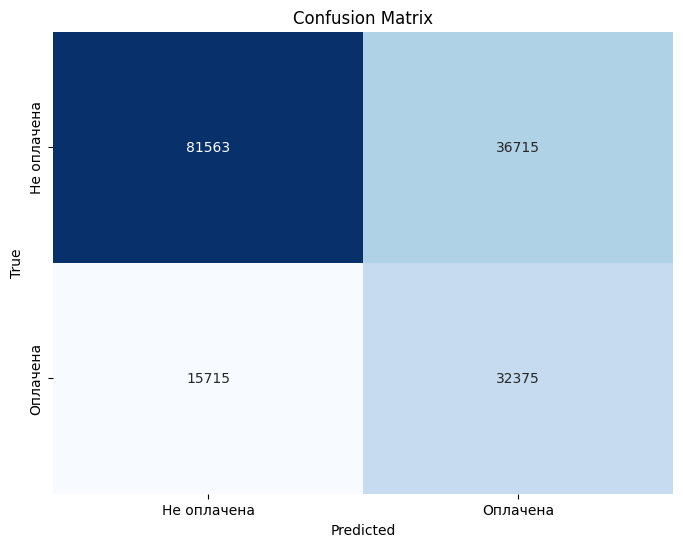

              precision    recall  f1-score   support

           0       0.84      0.69      0.76    118278
           1       0.47      0.67      0.55     48090

    accuracy                           0.68    166368
   macro avg       0.65      0.68      0.65    166368
weighted avg       0.73      0.68      0.70    166368

ROC-AUC на тестовой выборке равен 0.748


In [92]:
score_func(clf, X_test_small, y_test)

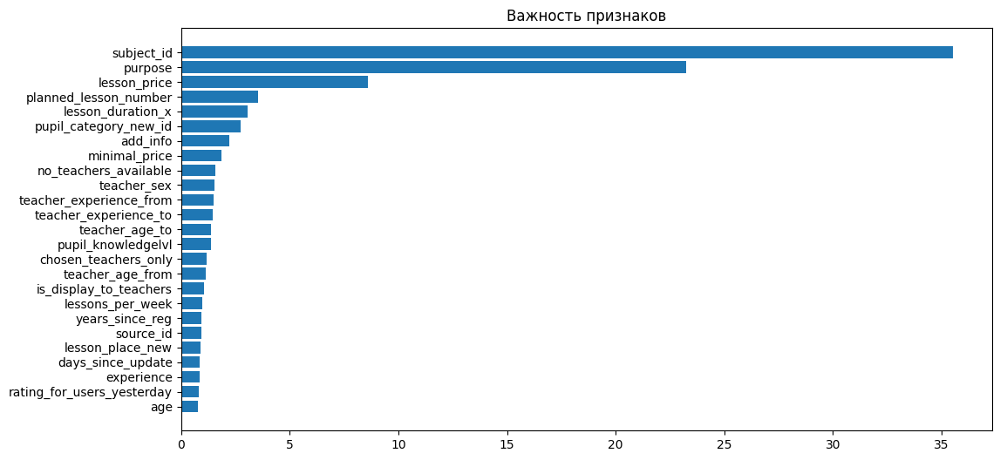

In [93]:
feature_importance = clf.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(12, 6))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X_train.columns)[sorted_idx])
plt.title('Важность признаков')
plt.show()

In [94]:
import shap

shap.initjs()

invalid value encountered in subtract


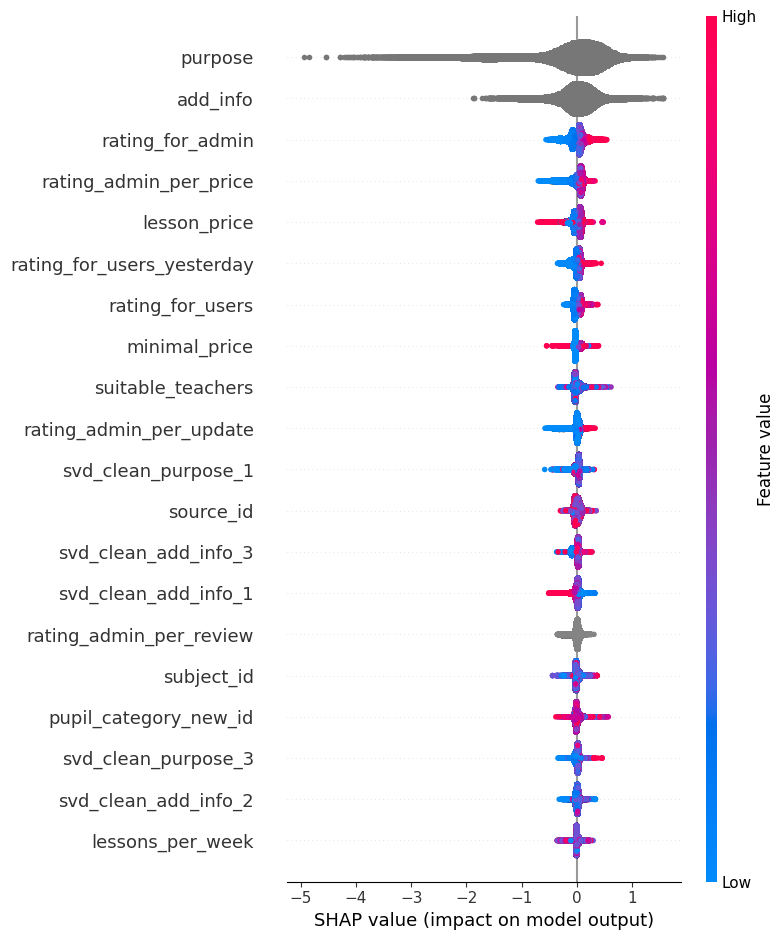

In [95]:
explainer = shap.TreeExplainer(clf)

train_dataset = Pool(data=X_train_small, label=y_train, cat_features=category_features, text_features=text_features)
shap_values = explainer.shap_values(train_dataset)

shap.summary_plot(shap_values, X_train_small)

- Каждая точка – отдельное наблюдение;
- Цветом обозначены значения соответствующего признака: высокие – красным , низкие – синим;
- Признаки расположены на оси y по мере уменьшения их важности;
- По оси x находятся значения Шепли, которые влияют на отнесение к классу 1 (оплаченным заявкам) либо положительно, либо отрицательно.

Видим, что важность признаков отличается при оценке CatBoost и с помощью SHAP. SHAP показывает те признаки, которые были важнее для выявления оплаченных заявок.

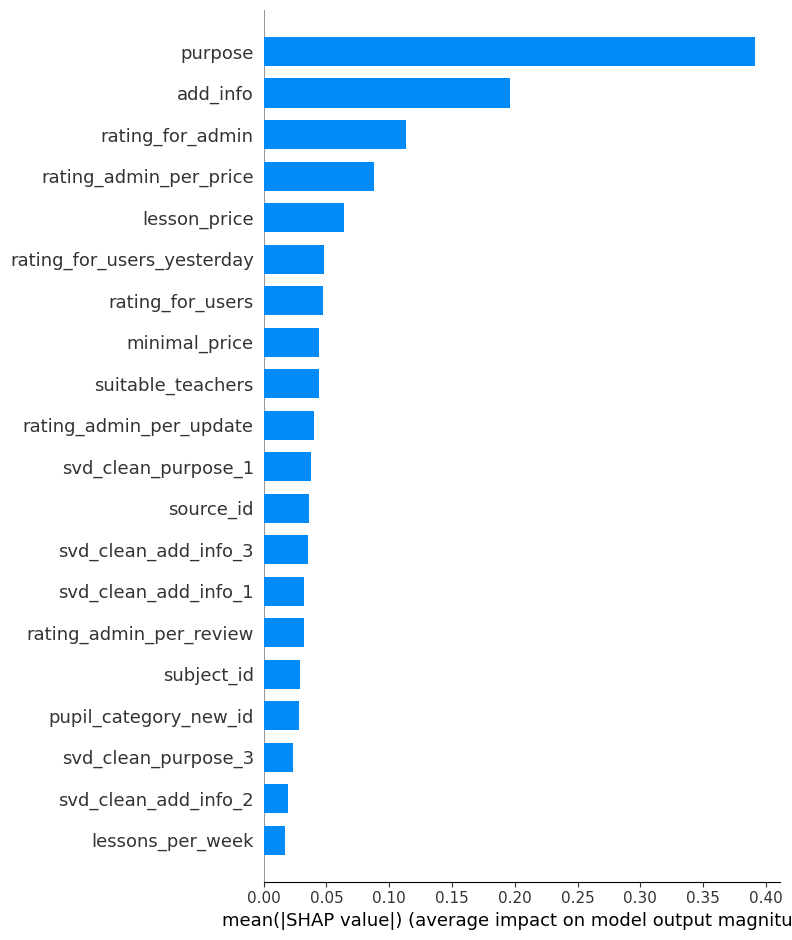

In [96]:
explainer = shap.TreeExplainer(clf)

train_dataset = Pool(data=X_train_small, label=y_train, cat_features=category_features, text_features=text_features)
shap_values = explainer.shap_values(train_dataset)

shap.summary_plot(shap_values, X_train_small, plot_type="bar")

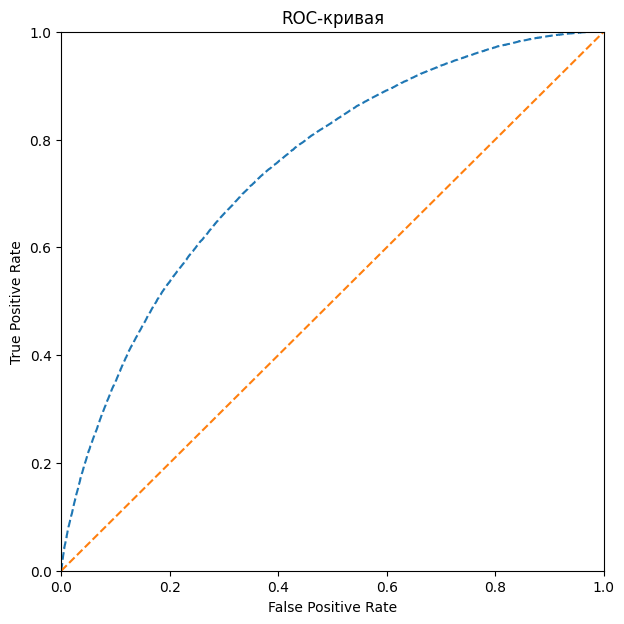

In [97]:
preds = clf.predict_proba(X_test_small)

fpr, tpr, thresholds = roc_curve(y_test, preds[:, 1]) 

plt.figure(figsize=(7, 7))

# ROC-кривая CatBoost
plt.plot(fpr, tpr, linestyle='--')

# ROC-кривая случайной модели
plt.plot([0, 1], [0, 1], linestyle='--')

# Установим границы осей от 0 до 1
plt.xlim(0, 1)
plt.ylim(0, 1)

plt.xlabel('False Positive Rate')
plt.ylabel("True Positive Rate")
plt.title("ROC-кривая")
plt.show()

### Калибровка вероятностей

In [98]:
# Калибровка вероятностей с помощью CalibratedClassifierCV
calibrated_classifier = CalibratedClassifierCV(clf, method='sigmoid', cv='prefit')
calibrated_classifier.fit(X_test_small, y_test)

# Получение вероятностей модели CatBoost
preds = clf.predict_proba(X_test_small)

# Получение откалиброванных вероятностей
calibrated_probabilities = calibrated_classifier.predict_proba(X_test_small)

# Оценка качества калибровки
log_loss_before = log_loss(y_test, preds)
log_loss_after = log_loss(y_test, calibrated_probabilities)
print(f"Log Loss до калибровки: {log_loss_before}")
print(f"Log Loss после калибровки: {log_loss_after}")

Log Loss до калибровки: 0.5813416029857802
Log Loss после калибровки: 0.5179898363160332


In [99]:
result_after = roc_auc_score(y_test, calibrated_probabilities[:, 1])
print('ROC-AUC на тестовой выборке после калибровки равен', np.round(result_after, 3))

ROC-AUC на тестовой выборке после калибровки равен 0.748


ROC-AUC после калибровки не изменился.

Чтобы модель находила как можно больше заявок, которые потенциально будут оплачены, необходимо повышать полноту, изменяя порог классификации в меньшую сторону (например, 0.3). Попробуем посмотреть, как изменится предсказание с таким порогом на откалиброванных предсказаниях и до калибровки.

In [100]:
optimal_threshold = 0.3

# до калибровки
predicted_labels = (preds >= optimal_threshold).astype(int)
conf_matrix = metrics.confusion_matrix(y_test, predicted_labels[:, 1])

print(conf_matrix)
print(metrics.classification_report(y_test,predicted_labels[:, 1]))

[[34611 83667]
 [ 2893 45197]]
              precision    recall  f1-score   support

           0       0.92      0.29      0.44    118278
           1       0.35      0.94      0.51     48090

    accuracy                           0.48    166368
   macro avg       0.64      0.62      0.48    166368
weighted avg       0.76      0.48      0.46    166368



In [101]:
# для откалиброванных предсказаний
predicted_labels = (calibrated_probabilities >= optimal_threshold).astype(int)
conf_matrix = metrics.confusion_matrix(y_test, predicted_labels[:, 1])

print(conf_matrix)
print(metrics.classification_report(y_test,predicted_labels[:, 1]))

[[80591 37687]
 [15291 32799]]
              precision    recall  f1-score   support

           0       0.84      0.68      0.75    118278
           1       0.47      0.68      0.55     48090

    accuracy                           0.68    166368
   macro avg       0.65      0.68      0.65    166368
weighted avg       0.73      0.68      0.69    166368



Видим, что откалиброванные предсказания более сбалансированные между 0 и 1, тогда как до калибровки предсказания с пороговым значением 0.3 выявляют 94% всех оплаченных заявок.

# Отчет

Перед нами стояла задача: разработать модель классификации, которая по имеющейся информации о клиенте и заявке будет предсказывать вероятность оплаты заявки клиентом. Основной метрикой качества выступал ROC-AUC.

В ходе работы были выполнены следующие шаги:

1. **Обзор и подготовка данных.**

- Были изучены данные, имеющиеся в распоряжении.
- Объединены таблицы, проведена предобработка: скорректированы аномальные данные (в возрасте учителей, стоимости урока и т.д.), удалены дубли и неинформативные признаки и те, которые могли бы дать утечку.

**Выводы о составе и качестве данных:**

- дисбаланс таргетного признака: оплаченных заявок в 3 раза меньше, чем неоплаченных (даже с учетом того, что все дубли заявок мы тоже помечали как оплаченные).
- данные содержат много аномальных значений и пропусков. Поскольку мы использовали модель CatBoost, которая устойчива к выбросам, мы сделали лишь небольшую предобработку. Для других моделей (например, логистической регрессии) необходима будет более серьезная предобработка данных.

2. **Исследовательский анализ данных.**

- Изучено взаимоотношение признаков в зависимости от того, оплачена ли заявка или нет.
- Исследована корреляция признаков.

**Выводы по проведенному исследованию:**

- Признак no_teachers_available явно указывает на неоплаченные заявки (в случае, если нет доступных учителей).
- У оплаченных и неоплаченных заявок есть различия в медианных значениях по признакам lesson_price, teacher_experience_from, days_since_update, rating_for_users_yesterday, rating_for_admin, rating_for_users, effective_rating, review_num, lesson_cost.
- Чем меньше отзывов у учителя и ниже рейтинг, тем больше вероятность неоплаченной заявки, а с увеличением рейтинга и количества отзывов количество оплаченных заявок растет.
- Обнаружили взаимозависимость: чем выше рейтинг учителя, тем меньше дней с последнего апдейта прошло. То есть учителя с высоким рейтингом - более активные пользователи платформы.
- Признаки в большинстве своем слабо коррелируют между собой, то есть проблемы мультиколлинеарности нет. Заметна высокая корреляция у рейтингов. Таргет ни с какими признаками не коррелирует.


3. **Генерация новых признаков.**

Проверены различные гипотезы по созданию новых признаков, как по количественным и категориальным, так и по текстовым данным.
В результате были выбраны следующие признаки:

- Признаки на основе рейтингов, и других количественных данных, которые показали различие для таргета на графиках: делили рейтинги на число отзывов, цену, а также на число дней, прошедших с апдейта страницы.
- Признак количества подходящих учителей для каждого order_id (на основе таблицы suitable_teachers).
- Признаки на основе текстовых данных purpose и add_info: провели их лемматизацию, трансформировали с помощью TF-IDF и затем с помощью TruncatedSVD (скрытый семантический анализ) извлекли для каждого из текстовых признаков по 3 уплотненных признака.


4. **Подбор и обучение моделей.**

В качестве модели была выбрана CatBoost, поскольку эксперименты показали, что она наилучшим образом справляется с обработкой текстовых и категориальных данных и показывает достаточно высокие результаты. После проведенного анализа важности признаков были выбраны ТОП-25 признаков для обучения модели.

```
Итоговая модель

clf = CatBoostClassifier(random_seed=42,
                        thread_count=-1,
                        use_best_model=True,
                             eval_metric='AUC',
                        cat_features=cat_features,
                        text_features=text_features,
                        colsample_bylevel = 0.1,
                        subsample = 0.95,
                        bootstrap_type='Bernoulli',
                             auto_class_weights='Balanced',
                             iterations=2000,
                             early_stopping_rounds=1000,
                            verbose=300)
```                 

В результате удалось достичь на тестовой выборке следующих результатов:

- ROC AUC = **0.748**

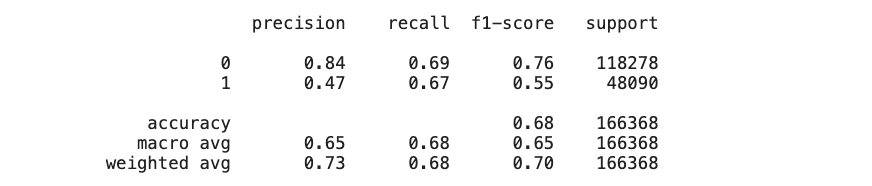

Важность признаков

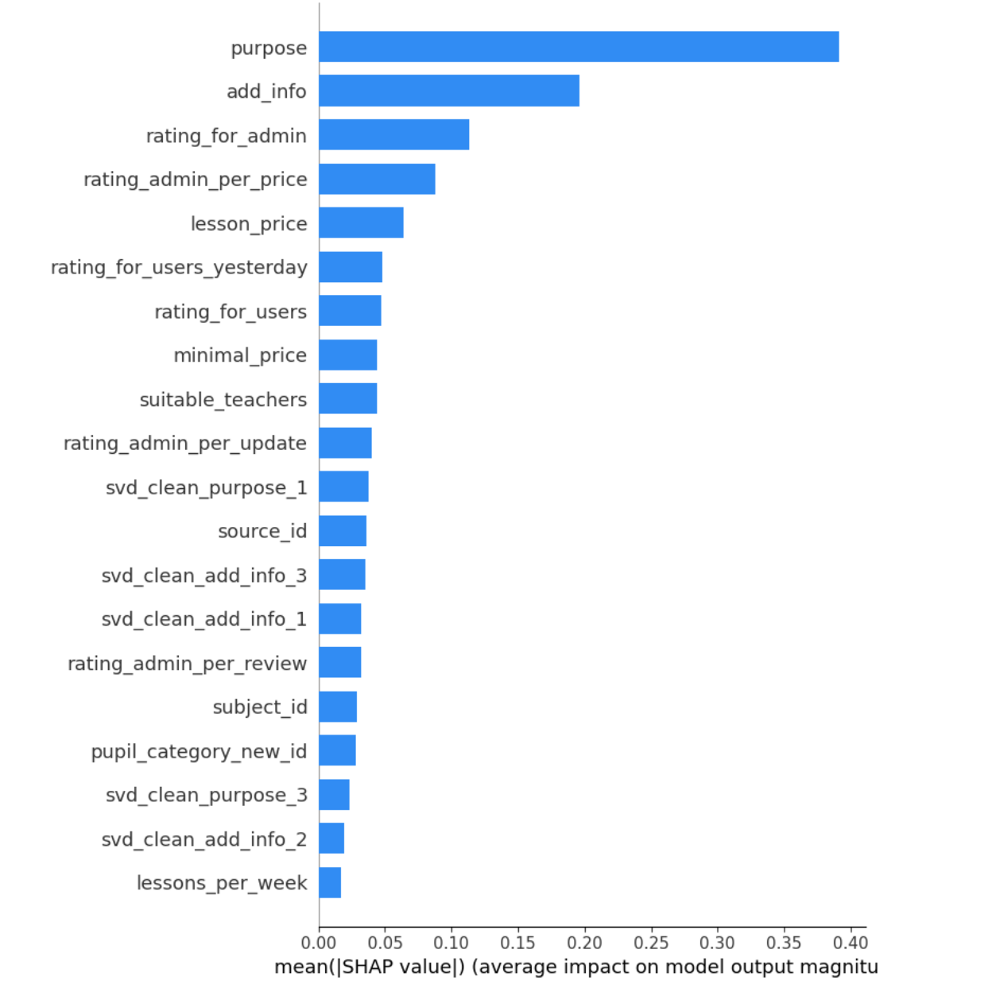

Данное распределение важности признаков отчасти перекликается с тем, что мы обнаружили в ходе исследовательского анализа данных. Оплаченные заявки в первую очередь отличаются рейтингом и ценой урока.

Наиболее важными признаками оказались те, которые были выявлены на основе текстовых данных, а также те, которые мы создали на основе рейтингов относительно цены/отзывов/обновлений.


Распределение оплаченных/неоплаченных заявок в сравнении с предсказанием моделью

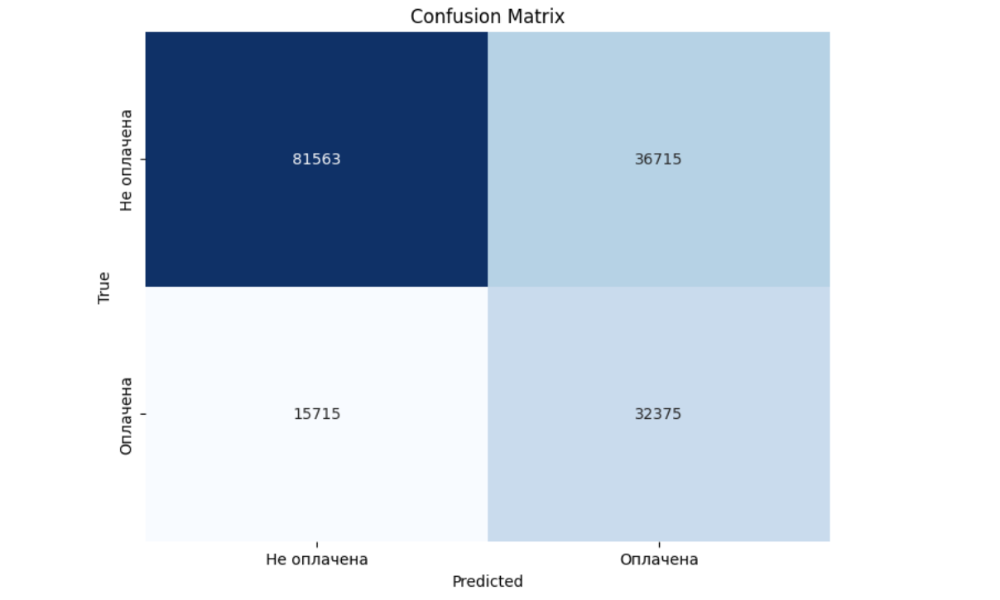

**Рекомендация:** При изменении порога на 0.3 можно достичь распределения:
```
 [34611 83667]
 [ 2893 45197]
 ```